<a href="https://colab.research.google.com/github/lojudex/knowledge-discovery/blob/main/Generative_Model_%2B_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Download Dataset**

In [ ]:
#download a file from Google Drive and to unzip or extract the contents of a ZIP archive file. 
! gdown --id 1wBaZeI95C3-3rr0qaUvWZdooUKi28VFe
! unzip -q /content/Xray_dataset.zip

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1wBaZeI95C3-3rr0qaUvWZdooUKi28VFe
To: /content/Xray_dataset.zip
100% 59.8M/59.8M [00:03<00:00, 19.5MB/s]


# **Install Requirements**

In [ ]:
! pip install torchmetrics #collection of metrics for evaluating machine learning models trained
! pip install torch-fidelity #evaluating and comparing the fidelity of generative models
! pip install torchmetrics[image]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 12.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 6.6 MB/s eta 0:00:00


# **Define Generative Model**

In [ ]:
from __future__ import print_function
#%matplotlib inline
import argparse
import datetime
import os
import os.path
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchvision.utils import save_image
from torch.utils.data import SubsetRandomSampler
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from IPython.display import clear_output
from tqdm import tqdm

This code initializes various variables that affect the GAN model training process, such as batch size, number of epochs, image sizes, learning rates, and more. These variables are used to configure the model and optimizer during training.

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
batch_size = 32
# Number of training epochs: the number of times the entire dataset will be used for model training.
num_epochs = 200
#load a pre-trained model
LOAD_MODEL = False

#train both generator and discriminator
TRAIN_ALL = False
#All images will be resized to this size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector, which is used as input to the generator.
nz = 100

# Size of feature maps in generator: features extracted from the generator during image generation.
ngf = 64

# Size of feature maps in discriminator: features extracted from the discriminator during discrimination
ndf = 64

# Learning rate optimizers: check how fast model weights are updated during training.
lr = 0.002
lr_d = 0.0002
# Beta1-2 hyperparam for Adam optimizers: affect the behavior of the optimizer
beta1 = 0.5
beta2 = 0.999

real_label = 1. #label real image
fake_label = 0. #label fake image
# Input to generator: latent noise batch used to generate synthetic images during model training
fixed_noise = torch.randn(64, nz, 1, 1, device=device) #batch of 64
# Define Loss function: to calculate the error between the real labels and the labels predicted by the discriminator during training
criterion = nn.BCELoss()

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__ #allows you to identify the type of layer
    if classname.find('Conv') != -1: #Initializing weights with random values
        nn.init.normal_(m.weight.data, 0.0, 0.02) #from a normal distribution with mean 0 and sd 0.02.
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02) #mean 1 and sd 0.02
        nn.init.constant_(m.bias.data, 0) #batch normalization starts from a neutral point.

**Architecture Generator**

The Generator class defines the generator architecture of a GAN, specifying the different transposed convolutional layers, batch normalizations, and activation functions used to generate synthetic images from latent noise.

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution: transforms a latent noise vector into a dimension tensor (ngf * 8) x 4 x 4
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False), # Kernel size 4, stride 1 and padding 0.
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True), #Applies activation function to input tensor
            #gradually increase the spatial dimension of the input tensors and reduce the num of channels.
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False), 
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # the last layer of the generator, input:(ngf) x 32 x 32
            # output:(nc) x 64 x 64, number of channels in the generated images
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh() #output between -1 and 1.
            
        )
#how the input is passed through the generator and the result of the final output
    def forward(self, input):
        return self.main(input)

**Architecture Discriminator**

The Discriminator class defines the discriminator architecture of a GAN, specifying the different convolutional layers, batch normalizations, activation functions, and dropout used to distinguish between real images and synthetic images generated by the generator.

In [ ]:

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input tensor(nc) x 64 x 64 and transforms it into a tensor of size (ndf) x 32 x 32
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False), 
            nn.LeakyReLU(0.2, inplace=True), #activation function 
            nn.Dropout(p=0.5), # prevent overfitting during training.
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(p=0.5),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.Dropout(p=0.25),
            nn.LeakyReLU(0.2, inplace=True),
            #input tensor (ndf*8) x 4 x 4 and transforms it into an output tensor with dimension 1
            #probability that the input image is real or synthetic.
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid() #output between 0 e 1
        )

    def forward(self, input):
        return self.main(input)

Generate and display a real-time graph while training a neural network.

In [ ]:
def plot(name, train_epoch, values, path, save):
    clear_output(wait=True)
    plt.close('all')
    fig = plt.figure()
    fig = plt.ion()
    fig = plt.subplot(1, 1, 1)
    fig = plt.title('epoch: %s -> %s: %s' % (train_epoch, name, values[-1]))
    fig = plt.ylabel(name)
    fig = plt.xlabel('train_set')
    fig = plt.plot(values)
    fig = plt.grid()
    get_fig = plt.gcf()
    fig = plt.draw()  # draw the plot
    fig = plt.pause(1)  # show it for 1 second
    if save:
        now = datetime.datetime.now()
        get_fig.savefig('%s/%s_%.3f_%d_%s.png' %
                        (path, name, train_epoch, values[-1], now.strftime("%Y-%m-%d_%H:%M:%S")))

Saves the model, optimizers, metrics, and other items of interest used in training to a specified file. 

Also, create a folder for training charts if it doesn't already exist.

In [ ]:
def save_model(generator, discriminator, gen_optimizer, dis_optimizer, metrics, num_epochs):
    now = datetime.datetime.now()
    g_losses = metrics['train.G_losses'][-1] #last loss values generetor
    d_losses = metrics['train.D_losses'][-1] #last loss values discriminator
    name = "%+.3f_%+.3f_%d_%s.dat" % (g_losses, d_losses, num_epochs, now.strftime("%Y-%m-%d_%H:%M:%S"))
    fname = os.path.join('.', 'augGAN/model', name)
    #we create dictionary with all the elements to save
    states = {
            'state_dict_generator': generator.state_dict(),
            'state_dict_discriminator': discriminator.state_dict(),
            'gen_optimizer': gen_optimizer.state_dict(),
            'dis_optimizer': dis_optimizer.state_dict(),
            'metrics': metrics,
            'train_epoch': num_epochs,
            'date': now.strftime("%Y-%m-%d_%H:%M:%S"),
    }
    torch.save(states, fname)
    path='augGAN/plots/train_%+.3f_%+.3f_%s'% (g_losses, d_losses, now.strftime("%Y-%m-%d_%H:%M:%S"))
    try:
      os.mkdir(os.path.join('.', path)) #created the full path to the save file
    except Exception as error:
      print(error)



The train_gan function implements the **training of a GAN** using a generator, a discriminator, optimizers and a dataloader. 

During training, several metrics such as Inception Score and Frechet Inception Distance are calculated and generator and discriminator losses are saved. 

The generated images are saved in the img_list for later plotting. At the end of the training, the save_model function is called to save the model and metrics.

In [ ]:
from torchmetrics.image.inception import InceptionScore
from torchmetrics.image.fid import FrechetInceptionDistance


img_list = [] #save the generated images
G_losses = [] #save generator loss
D_losses = [] #save discriminator loss
fid = FrechetInceptionDistance(feature=64, normalize=True).cuda()
inception = InceptionScore(normalize=True).cuda()


def train_gan(generator, discriminator, gen_optimizer, dis_optimizer, train_loader, num_epochs, metrics):
        iters = 0
        print("GAN training started :D...")

        for epoch in range(num_epochs):
            print("Epoch %d" %(epoch+1))
            # For each batch in the dataloader
            for i, data in enumerate(tqdm(train_loader, 0)):
                #Update D network: maximize log(D(x)) + log(1 - D(G(z)))
                # Train with all-real batch
                discriminator.zero_grad() #the discriminator gradient is zeroed
                # Format batch
                b_real = data[0].to(device)
                b_size = b_real.size(0)
                label = torch.full((b_size,), real_label, device=device)
                # Forward pass real batch through D 
                #calculated the loss of the discriminator with respect to the real images
                output = discriminator(b_real).view(-1)
                # Calculate loss on all-real batch
                errD_real = criterion(output, label)
                # Calculate gradients for D in backward pass respects to real images
                errD_real.backward()
                D_x = output.mean().item() #average of the discriminator outputs
                metrics['train.D_x'].append(D_x)

                ## Train with all-fake batch
                # Generate batch of latent vectors
                noise = torch.randn(b_size, nz, 1, 1, device=device)
                # Generate fake image batch with G
                fake = generator(noise)

                # InceptionScore metrics 
                fid.update(torch.tensor(b_real, dtype=torch.float32).repeat(1, 3, 1, 1), real=True)
                fid.update(torch.tensor(fake, dtype=torch.float32).repeat(1, 3, 1, 1), real=False)
                metrics['fid'].append(fid.compute())

                # FrechetInceptionDistance metrics
                inception.update(torch.tensor(fake, dtype=torch.float32).repeat(1, 3, 1, 1))
                mean_is, std_is = inception.compute()
                metrics['is'].append(mean_is)

                label.fill_(fake_label)
                # Classify all fake batch with D
                output = discriminator(fake.detach()).view(-1)
                # Calculate D's loss on the all-fake batch
                errD_fake = criterion(output, label)
                # Calculate the gradients for this batch
                errD_fake.backward()
                D_G_z1 = output.mean().item()
                metrics['train.D_G_z1'].append(D_G_z1)
                # Add the gradients from the all-real and all-fake batches
                errD = errD_real + errD_fake
                # Update D
                dis_optimizer.step()

                #The gradients of the generator are reset to zero before the backward pass.
                generator.zero_grad()
                label.fill_(real_label)  # labels generator are set to real label value
                # Since we just updated D, perform another forward pass of all-fake batch through D
                output = discriminator(fake).view(-1)
                # Calculate G's loss based on this output
                errG = criterion(output, label)
                # Calculate gradients for G
                errG.backward()
                D_G_z2 = output.mean().item()
                metrics['train.D_G_z2'].append(D_G_z2)
                # Update G
                gen_optimizer.step()

                # Save Losses for plotting later
                G_losses.append(errG.item())
                D_losses.append(errD.item())
                metrics['train.G_losses'].append(errG.item())
                metrics['train.D_losses'].append(errD.item())

                # Check how the generator is doing by saving G's output on fixed_noise
                if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
                    with torch.no_grad():
                        fake = generator(fixed_noise).detach().cpu()
                    img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

                iters += 1
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch+1, num_epochs, i, len(train_loader),
                    errD.item(), errG.item(), D_x, D_G_z1, D_G_z2), "FID:", fid.compute().item(), "InceptionScore:",mean_is.item())
        save_model(generator, discriminator, gen_optimizer, dis_optimizer, metrics, num_epochs)

Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 337MB/s]
/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


This function **searches for samples of a specific class** (class_name) in a given dataset and **returns a list of indices corresponding to the found samples**. It also prints the total number of samples found for that class.

In [ ]:
def get_indices(dataset, class_name, indices):
    j = 0
    for i in range(len(dataset.targets)):
        if dataset.targets[i] == class_name:
            indices.append(i)
            j += 1
    print("Total Samples of class", class_name,"found are",j)
    return indices

This function **visualizes the real and generated fake images** produced by the generator network. It saves the visualization as a PNG image file, including information about the generator and discriminator losses, the number of epochs, and the timestamp.

In [ ]:
def visualize_generated_imgs(generator, discriminator, num_epochs, metrics, loader):
    print('Testing Block.........')
    now = datetime.datetime.now()
    g_losses = metrics['train.G_losses'][-1]
    d_losses = metrics['train.D_losses'][-1]
    path='augGAN/output_images'
    try:
      os.makedirs(os.path.join('.', path), exist_ok=True)
    except Exception as error:
      print(error)

    real_batch = next(iter(loader))
    
    test_img_list = []
    test_noise = torch.randn(batch_size, nz, 1, 1, device=device)
    test_fake = generator(test_noise).detach().cpu()
    test_img_list.append(vutils.make_grid(test_fake, padding=2, normalize=True))

    fig = plt.figure(figsize=(15,15))
    ax1 = plt.subplot(1,2,1)
    ax1 = plt.axis("off")
    ax1 = plt.title("Real Images")
    ax1 = plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

    ax2 = plt.subplot(1,2,2)
    ax2 = plt.axis("off")
    ax2 = plt.title("Fake Images")
    ax2 = plt.imshow(np.transpose(test_img_list[-1],(1,2,0)))
    #ax2 = plt.show()
    fig.savefig('%s/image_%.3f_%.3f_%d_%s.png' %
                    (path, g_losses, d_losses, num_epochs, now.strftime("%Y-%m-%d_%H:%M:%S")))

This function **synthesizes and saves a specified number of images using the generator network**. The images are generated in batches, and each batch is passed through the discriminator to evaluate its output. The synthesized images are then saved as PNG files in a specified directory structure.

In [ ]:
def synthesize_imgs(generator, discriminator, metrics, n_images, folname):
    now = datetime.datetime.now()
    g_losses = metrics['train.G_losses'][-1]
    d_losses = metrics['train.D_losses'][-1]
    pathc=f'augGAN/output_images/{n_images}/'
    pathn=f'{folname}'

    try:
      os.makedirs(os.path.join('.', pathc),exist_ok=True)
      os.makedirs(os.path.join(pathc, pathn), exist_ok=True)
    except Exception as error:
      print(error)

    im_batch_size = 50
    #n_images=100
    for i_batch in range(0, n_images, im_batch_size):
        gen_z = torch.randn(im_batch_size, 100, 1, 1, device=device)
        gen_images = generator(gen_z)
        dis_result = discriminator(gen_images).view(-1)
        images = gen_images.to("cpu").clone().detach()
        images = images.numpy().transpose(0, 2, 3, 1)
        for i_image in range(gen_images.size(0)):
            save_image(gen_images[i_image, :, :, :], os.path.join(pathc  + pathn, 
                        f'image_{i_batch+i_image:04d}.png'), normalize= True)

    print('Testing Block.........')
    print('Discriminator_mean: ', dis_result.mean().item())


# **Train The Model**

This code sets up the necessary directories, defines transformations, creates datasets and data loaders, initializes the models and optimizers, and trains the GAN model using the specified data loaders.

In [ ]:
#creation of the directories
for func in [
    lambda: os.makedirs(os.path.join('.', 'augGAN'), exist_ok=True),
    lambda: os.makedirs(os.path.join('.', 'augGAN/model'), exist_ok=True),
    lambda: os.makedirs(os.path.join('.', 'augGAN/plots'), exist_ok=True),
    lambda: os.makedirs(os.path.join('.', 'augGAN/output_images'), exist_ok=True)]:  # create directories
  try:
    func()
  except Exception as error:
    print(error)
    continue

#names of different metrics to be tracked during training
METRIC_FIELDS = [
    'train.D_x',
    'train.D_G_z1',
    'train.D_G_z2',
    'train.G_losses',
    'train.D_losses',
    'fid',
    'is',
    
]
metrics = {field: list() for field in METRIC_FIELDS}

#transformation respect to num input channels
if nc==1:
    mu = (0.5)
    sigma = (0.5)
    transform = transforms.Compose([#transforms.RandomHorizontalFlip(),
                                    transforms.Grayscale(num_output_channels=1),
                                    transforms.Resize((64,64)),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mu, sigma)])
elif nc==3:
    mu = (0.5,0.5,0.5)
    sigma = (0.5,0.5,0.5)
    #Originally authors used just scaling
    transform = transforms.Compose([#transforms.RandomHorizontalFlip(),
                                    transforms.Resize((64,64)),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mu, sigma)])
else:
    print("Tranformation not defined for this option")

#creates instances of the ImageFolder dataset class for different training sets 
data_dir = '/content/Xray_dataset'

trainset0 = datasets.ImageFolder(os.path.join(
          data_dir, "train/"), transform=transform)
trainset500 = datasets.ImageFolder(os.path.join(
          data_dir, "train_classic/500/"), transform=transform)
trainset1000 = datasets.ImageFolder(os.path.join(
          data_dir, "train_classic/1000/"), transform=transform)
trainset2000 = datasets.ImageFolder(os.path.join(
          data_dir, "train_classic/2000/"), transform=transform)

listtrainset_no_aug = [trainset0]
listtrainset_classic = [trainset500,trainset1000]
listtrainset = listtrainset_no_aug + listtrainset_classic
train_set = torch.utils.data.ConcatDataset(listtrainset) #combines all the individual training sets into a single dataset.

##initializes the generator and discriminator models 
#applies weight initialization to the models.
generator = Generator().to(device)
discriminator = Discriminator().to(device)
generator.apply(weights_init)
discriminator.apply(weights_init)
gen_optimizer = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2)) #Adam optimizer
dis_optimizer = optim.Adam(discriminator.parameters(), lr=lr_d, betas=(beta1, beta2))

#it loads the saved model checkpoint
if LOAD_MODEL:
    if torch.cuda.is_available():
      checkpoint = torch.load(PATH)
    else:
      checkpoint = torch.load(PATH, map_location=lambda storage, loc: storage) #load the model on a CPU even if it was trained on a GPU.

    #restores the weights of the generator, discriminator and optimizer          
    generator.load_state_dict(checkpoint['state_dict_generator'])
    discriminator.load_state_dict(checkpoint['state_dict_discriminator'])
    gen_optimizer.load_state_dict(checkpoint['gen_optimizer'])
    dis_optimizer.load_state_dict(checkpoint['dis_optimizer'])
    metrics=checkpoint['metrics']
    #epoch
    num_epochs=checkpoint['train_epoch']
    date=checkpoint['date']
    generator.train(mode=False)
    discriminator.train(mode=False)
    print('GAN loaded for epochs: ', num_epochs)
    print(generator)
    print(discriminator)
    print(gen_optimizer)
    print(dis_optimizer)
    print(date)
#If LOAD_MODEL is set to False, the code checks if TRAIN_ALL is set to True.
else:
    if TRAIN_ALL:
        train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size,
                                                  shuffle=True) #data loader is created 
        train_gan(generator, discriminator, gen_optimizer, dis_optimizer, train_loader,
                  num_epochs, metrics) #train the GAN model 
        test2(generator, discriminator, num_epochs, metrics, train_loader) #visualize the generated images using the trained models

    #If TRAIN_ALL is set to False, the code creates a data loader for a subset of the training set.
    else:
 
        train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size,
                                                  shuffle=True)
        mask =[x[1]==0 for x in train_loader.dataset] #here is 0 for covid; 1 for normal; 2 for pneumonia_bacteria; 3 for pneumonia_virus for x-ray dataset
        idx= np.arange(len(train_loader.dataset))[mask]

        print("Total samples now are ",len(idx))
        selected_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size,
                                                      sampler = SubsetRandomSampler(idx))
        train_gan(generator, discriminator, gen_optimizer, dis_optimizer, selected_loader,
                  num_epochs, metrics) #train the GAN model using the selected_loader.
     

Total samples now are  1060
GAN training started :D...
Epoch 1


  0%|          | 0/34 [00:00<?, ?it/s]<ipython-input-10-1ebd68649289>:43: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  fid.update(torch.tensor(b_real, dtype=torch.float32).repeat(1, 3, 1, 1), real=True)
<ipython-input-10-1ebd68649289>:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  fid.update(torch.tensor(fake, dtype=torch.float32).repeat(1, 3, 1, 1), real=False)
<ipython-input-10-1ebd68649289>:48: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inception.update(torch.tensor(fake, dtype=torch.float32).repeat(1, 3, 1, 1))
100%|██████████|

[1/200][33/34]	Loss_D: 1.5515	Loss_G: 2.3467	D(x): 0.3981	D(G(z)): 0.2632 / 0.1489 FID: 41.54315948486328 InceptionScore: 1.4938501119613647
Epoch 2


100%|██████████| 34/34 [00:09<00:00,  3.72it/s]


[2/200][33/34]	Loss_D: 3.0634	Loss_G: 3.7048	D(x): 0.6858	D(G(z)): 0.9167 / 0.0744 FID: 34.71034240722656 InceptionScore: 2.011744260787964
Epoch 3


100%|██████████| 34/34 [00:08<00:00,  4.22it/s]


[3/200][33/34]	Loss_D: 3.1827	Loss_G: 1.7665	D(x): 0.2655	D(G(z)): 0.4762 / 0.2121 FID: 31.284669876098633 InceptionScore: 2.2788245677948
Epoch 4


100%|██████████| 34/34 [00:07<00:00,  4.32it/s]


[4/200][33/34]	Loss_D: 1.2465	Loss_G: 1.7048	D(x): 0.4922	D(G(z)): 0.1820 / 0.2762 FID: 29.280017852783203 InceptionScore: 2.3094208240509033
Epoch 5


100%|██████████| 34/34 [00:08<00:00,  3.79it/s]


[5/200][33/34]	Loss_D: 1.9913	Loss_G: 5.0111	D(x): 0.7523	D(G(z)): 0.6748 / 0.0160 FID: 26.75255584716797 InceptionScore: 2.3407974243164062
Epoch 6


100%|██████████| 34/34 [00:08<00:00,  4.20it/s]


[6/200][33/34]	Loss_D: 1.9042	Loss_G: 3.4959	D(x): 0.6456	D(G(z)): 0.3686 / 0.0705 FID: 25.962636947631836 InceptionScore: 2.372201681137085
Epoch 7


100%|██████████| 34/34 [00:09<00:00,  3.68it/s]


[7/200][33/34]	Loss_D: 1.7161	Loss_G: 1.4319	D(x): 0.4338	D(G(z)): 0.4923 / 0.2771 FID: 23.383731842041016 InceptionScore: 2.409696340560913
Epoch 8


100%|██████████| 34/34 [00:08<00:00,  3.96it/s]


[8/200][33/34]	Loss_D: 1.1411	Loss_G: 1.0484	D(x): 0.5417	D(G(z)): 0.3264 / 0.3509 FID: 21.040508270263672 InceptionScore: 2.433917284011841
Epoch 9


100%|██████████| 34/34 [00:08<00:00,  4.09it/s]


[9/200][33/34]	Loss_D: 1.9327	Loss_G: 0.8309	D(x): 0.4037	D(G(z)): 0.4730 / 0.5052 FID: 19.400449752807617 InceptionScore: 2.4482076168060303
Epoch 10


100%|██████████| 34/34 [00:08<00:00,  4.09it/s]


[10/200][33/34]	Loss_D: 1.5584	Loss_G: 1.6593	D(x): 0.3591	D(G(z)): 0.2842 / 0.2113 FID: 18.084590911865234 InceptionScore: 2.477083921432495
Epoch 11


100%|██████████| 34/34 [00:08<00:00,  4.02it/s]


[11/200][33/34]	Loss_D: 0.8489	Loss_G: 1.4966	D(x): 0.6570	D(G(z)): 0.2584 / 0.2587 FID: 17.028287887573242 InceptionScore: 2.488563299179077
Epoch 12


100%|██████████| 34/34 [00:08<00:00,  4.20it/s]


[12/200][33/34]	Loss_D: 1.4762	Loss_G: 1.3703	D(x): 0.5027	D(G(z)): 0.4471 / 0.2665 FID: 16.418025970458984 InceptionScore: 2.4876561164855957
Epoch 13


100%|██████████| 34/34 [00:08<00:00,  4.18it/s]


[13/200][33/34]	Loss_D: 0.5213	Loss_G: 1.6235	D(x): 0.8281	D(G(z)): 0.2583 / 0.2783 FID: 15.502422332763672 InceptionScore: 2.5052783489227295
Epoch 14


100%|██████████| 34/34 [00:08<00:00,  4.07it/s]


[14/200][33/34]	Loss_D: 1.3813	Loss_G: 1.4844	D(x): 0.4958	D(G(z)): 0.2801 / 0.3389 FID: 14.624990463256836 InceptionScore: 2.5048093795776367
Epoch 15


100%|██████████| 34/34 [00:08<00:00,  4.24it/s]


[15/200][33/34]	Loss_D: 1.6820	Loss_G: 1.3369	D(x): 0.4679	D(G(z)): 0.4747 / 0.2877 FID: 13.841005325317383 InceptionScore: 2.514127016067505
Epoch 16


100%|██████████| 34/34 [00:08<00:00,  4.17it/s]


[16/200][33/34]	Loss_D: 0.9071	Loss_G: 1.2447	D(x): 0.7705	D(G(z)): 0.4699 / 0.3062 FID: 13.023489952087402 InceptionScore: 2.5215353965759277
Epoch 17


100%|██████████| 34/34 [00:09<00:00,  3.60it/s]


[17/200][33/34]	Loss_D: 1.5239	Loss_G: 1.0177	D(x): 0.5711	D(G(z)): 0.5628 / 0.4504 FID: 12.22817325592041 InceptionScore: 2.5433297157287598
Epoch 18


100%|██████████| 34/34 [00:10<00:00,  3.29it/s]


[18/200][33/34]	Loss_D: 1.5413	Loss_G: 1.9713	D(x): 0.4901	D(G(z)): 0.4661 / 0.1939 FID: 11.45175552368164 InceptionScore: 2.5704801082611084
Epoch 19


100%|██████████| 34/34 [00:07<00:00,  4.27it/s]


[19/200][33/34]	Loss_D: 1.7555	Loss_G: 1.9380	D(x): 0.4651	D(G(z)): 0.5404 / 0.1854 FID: 10.811312675476074 InceptionScore: 2.5724754333496094
Epoch 20


100%|██████████| 34/34 [00:08<00:00,  4.22it/s]


[20/200][33/34]	Loss_D: 1.8633	Loss_G: 1.4451	D(x): 0.3667	D(G(z)): 0.4593 / 0.2493 FID: 10.255083084106445 InceptionScore: 2.593928337097168
Epoch 21


100%|██████████| 34/34 [00:08<00:00,  3.94it/s]


[21/200][33/34]	Loss_D: 1.2753	Loss_G: 0.8270	D(x): 0.5803	D(G(z)): 0.4425 / 0.4972 FID: 9.768479347229004 InceptionScore: 2.6094884872436523
Epoch 22


100%|██████████| 34/34 [00:08<00:00,  4.20it/s]


[22/200][33/34]	Loss_D: 1.2132	Loss_G: 1.1339	D(x): 0.4739	D(G(z)): 0.3429 / 0.3779 FID: 9.375909805297852 InceptionScore: 2.6113994121551514
Epoch 23


100%|██████████| 34/34 [00:08<00:00,  4.19it/s]


[23/200][33/34]	Loss_D: 1.5493	Loss_G: 1.3519	D(x): 0.4940	D(G(z)): 0.5445 / 0.2754 FID: 8.967639923095703 InceptionScore: 2.6344518661499023
Epoch 24


100%|██████████| 34/34 [00:08<00:00,  4.18it/s]


[24/200][33/34]	Loss_D: 2.1143	Loss_G: 1.5173	D(x): 0.4073	D(G(z)): 0.6351 / 0.2433 FID: 8.668038368225098 InceptionScore: 2.6345081329345703
Epoch 25


100%|██████████| 34/34 [00:08<00:00,  4.24it/s]


[25/200][33/34]	Loss_D: 1.9086	Loss_G: 0.8557	D(x): 0.3791	D(G(z)): 0.5318 / 0.4307 FID: 8.307233810424805 InceptionScore: 2.653883457183838
Epoch 26


100%|██████████| 34/34 [00:08<00:00,  4.19it/s]


[26/200][33/34]	Loss_D: 2.4779	Loss_G: 1.0000	D(x): 0.2725	D(G(z)): 0.4763 / 0.4240 FID: 7.986632347106934 InceptionScore: 2.666125535964966
Epoch 27


100%|██████████| 34/34 [00:08<00:00,  4.18it/s]


[27/200][33/34]	Loss_D: 1.2335	Loss_G: 1.7617	D(x): 0.6185	D(G(z)): 0.4841 / 0.1997 FID: 7.728663921356201 InceptionScore: 2.6826770305633545
Epoch 28


100%|██████████| 34/34 [00:08<00:00,  4.22it/s]


[28/200][33/34]	Loss_D: 1.0495	Loss_G: 0.7996	D(x): 0.5318	D(G(z)): 0.3024 / 0.5071 FID: 7.476806640625 InceptionScore: 2.6781861782073975
Epoch 29


100%|██████████| 34/34 [00:08<00:00,  4.16it/s]


[29/200][33/34]	Loss_D: 1.4827	Loss_G: 1.4763	D(x): 0.5041	D(G(z)): 0.4867 / 0.2789 FID: 7.222311973571777 InceptionScore: 2.6803886890411377
Epoch 30


100%|██████████| 34/34 [00:08<00:00,  3.91it/s]


[30/200][33/34]	Loss_D: 2.0390	Loss_G: 0.9247	D(x): 0.3170	D(G(z)): 0.5427 / 0.4077 FID: 7.004772663116455 InceptionScore: 2.679499864578247
Epoch 31


100%|██████████| 34/34 [00:08<00:00,  4.20it/s]


[31/200][33/34]	Loss_D: 1.1109	Loss_G: 1.1664	D(x): 0.5490	D(G(z)): 0.3584 / 0.4092 FID: 6.812236309051514 InceptionScore: 2.6810333728790283
Epoch 32


100%|██████████| 34/34 [00:08<00:00,  4.15it/s]


[32/200][33/34]	Loss_D: 2.0645	Loss_G: 1.1127	D(x): 0.4719	D(G(z)): 0.6540 / 0.3347 FID: 6.66392183303833 InceptionScore: 2.6834449768066406
Epoch 33


100%|██████████| 34/34 [00:08<00:00,  4.16it/s]


[33/200][33/34]	Loss_D: 1.8964	Loss_G: 0.8243	D(x): 0.3876	D(G(z)): 0.5754 / 0.4409 FID: 6.519375324249268 InceptionScore: 2.681713342666626
Epoch 34


100%|██████████| 34/34 [00:08<00:00,  3.95it/s]


[34/200][33/34]	Loss_D: 1.4319	Loss_G: 0.7964	D(x): 0.4617	D(G(z)): 0.4096 / 0.4688 FID: 6.3387556076049805 InceptionScore: 2.6824395656585693
Epoch 35


100%|██████████| 34/34 [00:08<00:00,  4.14it/s]


[35/200][33/34]	Loss_D: 1.5720	Loss_G: 0.6697	D(x): 0.4528	D(G(z)): 0.5112 / 0.5413 FID: 6.20003080368042 InceptionScore: 2.6791999340057373
Epoch 36


100%|██████████| 34/34 [00:08<00:00,  4.14it/s]


[36/200][33/34]	Loss_D: 1.1959	Loss_G: 0.8640	D(x): 0.5673	D(G(z)): 0.4113 / 0.4257 FID: 6.023994445800781 InceptionScore: 2.684539556503296
Epoch 37


100%|██████████| 34/34 [00:08<00:00,  4.17it/s]


[37/200][33/34]	Loss_D: 1.6582	Loss_G: 1.3900	D(x): 0.4913	D(G(z)): 0.5843 / 0.3022 FID: 5.861113548278809 InceptionScore: 2.689479112625122
Epoch 38


100%|██████████| 34/34 [00:08<00:00,  4.13it/s]


[38/200][33/34]	Loss_D: 1.5300	Loss_G: 0.8731	D(x): 0.5289	D(G(z)): 0.5665 / 0.4318 FID: 5.729734420776367 InceptionScore: 2.6886003017425537
Epoch 39


100%|██████████| 34/34 [00:08<00:00,  4.15it/s]


[39/200][33/34]	Loss_D: 1.0971	Loss_G: 1.0299	D(x): 0.5353	D(G(z)): 0.3634 / 0.3864 FID: 5.582334041595459 InceptionScore: 2.6925132274627686
Epoch 40


100%|██████████| 34/34 [00:08<00:00,  4.13it/s]


[40/200][33/34]	Loss_D: 1.4423	Loss_G: 1.1604	D(x): 0.5225	D(G(z)): 0.5184 / 0.3491 FID: 5.4611711502075195 InceptionScore: 2.6945693492889404
Epoch 41


100%|██████████| 34/34 [00:08<00:00,  4.11it/s]


[41/200][33/34]	Loss_D: 1.2935	Loss_G: 0.6700	D(x): 0.5176	D(G(z)): 0.4488 / 0.5274 FID: 5.343812942504883 InceptionScore: 2.694535970687866
Epoch 42


100%|██████████| 34/34 [00:08<00:00,  4.14it/s]


[42/200][33/34]	Loss_D: 1.5120	Loss_G: 0.5963	D(x): 0.4221	D(G(z)): 0.4620 / 0.5571 FID: 5.249176979064941 InceptionScore: 2.6894326210021973
Epoch 43


100%|██████████| 34/34 [00:08<00:00,  3.87it/s]


[43/200][33/34]	Loss_D: 1.8081	Loss_G: 0.9432	D(x): 0.3470	D(G(z)): 0.4582 / 0.4049 FID: 5.143923759460449 InceptionScore: 2.6936001777648926
Epoch 44


100%|██████████| 34/34 [00:08<00:00,  4.08it/s]


[44/200][33/34]	Loss_D: 1.5379	Loss_G: 0.4824	D(x): 0.4121	D(G(z)): 0.4031 / 0.6293 FID: 5.048305988311768 InceptionScore: 2.692793369293213
Epoch 45


100%|██████████| 34/34 [00:08<00:00,  4.10it/s]


[45/200][33/34]	Loss_D: 1.3986	Loss_G: 1.3621	D(x): 0.5565	D(G(z)): 0.5411 / 0.2917 FID: 4.941037178039551 InceptionScore: 2.692774772644043
Epoch 46


100%|██████████| 34/34 [00:08<00:00,  4.10it/s]


[46/200][33/34]	Loss_D: 1.3345	Loss_G: 0.7562	D(x): 0.4657	D(G(z)): 0.4005 / 0.5017 FID: 4.8426690101623535 InceptionScore: 2.692861557006836
Epoch 47


100%|██████████| 34/34 [00:08<00:00,  4.07it/s]


[47/200][33/34]	Loss_D: 1.3375	Loss_G: 0.7724	D(x): 0.5763	D(G(z)): 0.5184 / 0.4724 FID: 4.742480278015137 InceptionScore: 2.6958985328674316
Epoch 48


100%|██████████| 34/34 [00:08<00:00,  4.10it/s]


[48/200][33/34]	Loss_D: 1.4235	Loss_G: 0.4594	D(x): 0.4017	D(G(z)): 0.3416 / 0.6467 FID: 4.648478984832764 InceptionScore: 2.69547700881958
Epoch 49


100%|██████████| 34/34 [00:08<00:00,  4.07it/s]


[49/200][33/34]	Loss_D: 1.2935	Loss_G: 0.8145	D(x): 0.6408	D(G(z)): 0.5528 / 0.4489 FID: 4.550408840179443 InceptionScore: 2.6954598426818848
Epoch 50


100%|██████████| 34/34 [00:08<00:00,  3.94it/s]


[50/200][33/34]	Loss_D: 1.2270	Loss_G: 0.8879	D(x): 0.5199	D(G(z)): 0.3800 / 0.4413 FID: 4.454123497009277 InceptionScore: 2.6988024711608887
Epoch 51


100%|██████████| 34/34 [00:08<00:00,  4.10it/s]


[51/200][33/34]	Loss_D: 1.4098	Loss_G: 0.9490	D(x): 0.4543	D(G(z)): 0.4411 / 0.3992 FID: 4.3748955726623535 InceptionScore: 2.6997952461242676
Epoch 52


100%|██████████| 34/34 [00:08<00:00,  4.05it/s]


[52/200][33/34]	Loss_D: 1.5816	Loss_G: 1.1780	D(x): 0.4508	D(G(z)): 0.5106 / 0.3966 FID: 4.292239189147949 InceptionScore: 2.7013814449310303
Epoch 53


100%|██████████| 34/34 [00:08<00:00,  4.04it/s]


[53/200][33/34]	Loss_D: 1.3757	Loss_G: 1.3109	D(x): 0.4879	D(G(z)): 0.4719 / 0.2780 FID: 4.230622291564941 InceptionScore: 2.699680805206299
Epoch 54


100%|██████████| 34/34 [00:08<00:00,  4.07it/s]


[54/200][33/34]	Loss_D: 2.0519	Loss_G: 0.6582	D(x): 0.3129	D(G(z)): 0.4901 / 0.5285 FID: 4.153051853179932 InceptionScore: 2.6982357501983643
Epoch 55


100%|██████████| 34/34 [00:08<00:00,  4.05it/s]


[55/200][33/34]	Loss_D: 1.3661	Loss_G: 1.0296	D(x): 0.5026	D(G(z)): 0.4778 / 0.3665 FID: 4.0803751945495605 InceptionScore: 2.698683023452759
Epoch 56


100%|██████████| 34/34 [00:08<00:00,  4.02it/s]


[56/200][33/34]	Loss_D: 1.3800	Loss_G: 1.0544	D(x): 0.5342	D(G(z)): 0.4956 / 0.3609 FID: 4.007343769073486 InceptionScore: 2.6977598667144775
Epoch 57


100%|██████████| 34/34 [00:08<00:00,  4.06it/s]


[57/200][33/34]	Loss_D: 1.5832	Loss_G: 1.1234	D(x): 0.4375	D(G(z)): 0.4951 / 0.3339 FID: 3.9325265884399414 InceptionScore: 2.6996171474456787
Epoch 58


100%|██████████| 34/34 [00:08<00:00,  4.05it/s]


[58/200][33/34]	Loss_D: 1.5110	Loss_G: 0.8711	D(x): 0.4565	D(G(z)): 0.4972 / 0.4382 FID: 3.8759572505950928 InceptionScore: 2.6961543560028076
Epoch 59


100%|██████████| 34/34 [00:08<00:00,  4.02it/s]


[59/200][33/34]	Loss_D: 1.2822	Loss_G: 1.0407	D(x): 0.4995	D(G(z)): 0.4408 / 0.3662 FID: 3.811772584915161 InceptionScore: 2.695218086242676
Epoch 60


100%|██████████| 34/34 [00:08<00:00,  4.06it/s]


[60/200][33/34]	Loss_D: 1.2282	Loss_G: 0.9418	D(x): 0.5441	D(G(z)): 0.4312 / 0.4094 FID: 3.7426295280456543 InceptionScore: 2.694812774658203
Epoch 61


100%|██████████| 34/34 [00:08<00:00,  4.02it/s]


[61/200][33/34]	Loss_D: 1.4637	Loss_G: 0.7756	D(x): 0.3952	D(G(z)): 0.3820 / 0.4801 FID: 3.6760973930358887 InceptionScore: 2.6950364112854004
Epoch 62


100%|██████████| 34/34 [00:08<00:00,  4.02it/s]


[62/200][33/34]	Loss_D: 1.2549	Loss_G: 1.0061	D(x): 0.6961	D(G(z)): 0.5515 / 0.3688 FID: 3.605682373046875 InceptionScore: 2.694091558456421
Epoch 63


100%|██████████| 34/34 [00:08<00:00,  4.01it/s]


[63/200][33/34]	Loss_D: 1.5371	Loss_G: 0.9671	D(x): 0.3717	D(G(z)): 0.4098 / 0.3886 FID: 3.554191827774048 InceptionScore: 2.6931662559509277
Epoch 64


100%|██████████| 34/34 [00:08<00:00,  4.05it/s]


[64/200][33/34]	Loss_D: 1.3793	Loss_G: 1.0278	D(x): 0.6039	D(G(z)): 0.5358 / 0.4256 FID: 3.490107536315918 InceptionScore: 2.697392225265503
Epoch 65


100%|██████████| 34/34 [00:08<00:00,  4.00it/s]


[65/200][33/34]	Loss_D: 1.2818	Loss_G: 1.1803	D(x): 0.4617	D(G(z)): 0.3914 / 0.3205 FID: 3.4343388080596924 InceptionScore: 2.6996867656707764
Epoch 66


100%|██████████| 34/34 [00:08<00:00,  4.01it/s]


[66/200][33/34]	Loss_D: 1.5773	Loss_G: 0.9589	D(x): 0.4284	D(G(z)): 0.4906 / 0.3855 FID: 3.381930351257324 InceptionScore: 2.70035982131958
Epoch 67


100%|██████████| 34/34 [00:08<00:00,  4.03it/s]


[67/200][33/34]	Loss_D: 1.2449	Loss_G: 1.6701	D(x): 0.5782	D(G(z)): 0.4896 / 0.2403 FID: 3.336801528930664 InceptionScore: 2.6989760398864746
Epoch 68


100%|██████████| 34/34 [00:08<00:00,  3.99it/s]


[68/200][33/34]	Loss_D: 1.3280	Loss_G: 1.1759	D(x): 0.5625	D(G(z)): 0.5155 / 0.3738 FID: 3.2893171310424805 InceptionScore: 2.6981475353240967
Epoch 69


100%|██████████| 34/34 [00:08<00:00,  3.99it/s]


[69/200][33/34]	Loss_D: 1.3480	Loss_G: 1.1892	D(x): 0.6007	D(G(z)): 0.5486 / 0.3200 FID: 3.2349002361297607 InceptionScore: 2.6984684467315674
Epoch 70


100%|██████████| 34/34 [00:08<00:00,  4.02it/s]


[70/200][33/34]	Loss_D: 1.5049	Loss_G: 1.8051	D(x): 0.4752	D(G(z)): 0.5004 / 0.1998 FID: 3.186891794204712 InceptionScore: 2.697493076324463
Epoch 71


100%|██████████| 34/34 [00:08<00:00,  3.94it/s]


[71/200][33/34]	Loss_D: 1.4333	Loss_G: 1.1665	D(x): 0.4937	D(G(z)): 0.4842 / 0.3263 FID: 3.1391565799713135 InceptionScore: 2.6963987350463867
Epoch 72


100%|██████████| 34/34 [00:08<00:00,  3.95it/s]


[72/200][33/34]	Loss_D: 1.4812	Loss_G: 1.5981	D(x): 0.6227	D(G(z)): 0.6295 / 0.2167 FID: 3.0934128761291504 InceptionScore: 2.6954381465911865
Epoch 73


100%|██████████| 34/34 [00:08<00:00,  4.00it/s]


[73/200][33/34]	Loss_D: 1.7646	Loss_G: 0.9574	D(x): 0.3833	D(G(z)): 0.5292 / 0.3879 FID: 3.0456418991088867 InceptionScore: 2.695612668991089
Epoch 74


100%|██████████| 34/34 [00:08<00:00,  3.94it/s]


[74/200][33/34]	Loss_D: 1.8623	Loss_G: 1.1593	D(x): 0.3794	D(G(z)): 0.5231 / 0.3640 FID: 3.0011203289031982 InceptionScore: 2.697706937789917
Epoch 75


100%|██████████| 34/34 [00:08<00:00,  3.94it/s]


[75/200][33/34]	Loss_D: 1.3314	Loss_G: 1.0044	D(x): 0.4958	D(G(z)): 0.4464 / 0.3691 FID: 2.9570302963256836 InceptionScore: 2.6986868381500244
Epoch 76


100%|██████████| 34/34 [00:08<00:00,  3.94it/s]


[76/200][33/34]	Loss_D: 1.5076	Loss_G: 1.0038	D(x): 0.5933	D(G(z)): 0.6109 / 0.3726 FID: 2.9173901081085205 InceptionScore: 2.702009916305542
Epoch 77


100%|██████████| 34/34 [00:08<00:00,  3.93it/s]


[77/200][33/34]	Loss_D: 1.7050	Loss_G: 1.1207	D(x): 0.4634	D(G(z)): 0.5830 / 0.3314 FID: 2.882370948791504 InceptionScore: 2.6996750831604004
Epoch 78


100%|██████████| 34/34 [00:08<00:00,  3.94it/s]


[78/200][33/34]	Loss_D: 0.8818	Loss_G: 1.2719	D(x): 0.7393	D(G(z)): 0.4352 / 0.2871 FID: 2.8510894775390625 InceptionScore: 2.702054262161255
Epoch 79


100%|██████████| 34/34 [00:08<00:00,  3.98it/s]


[79/200][33/34]	Loss_D: 1.5696	Loss_G: 1.1635	D(x): 0.4960	D(G(z)): 0.5557 / 0.3237 FID: 2.808295726776123 InceptionScore: 2.704716682434082
Epoch 80


100%|██████████| 34/34 [00:08<00:00,  3.93it/s]


[80/200][33/34]	Loss_D: 1.3555	Loss_G: 1.5624	D(x): 0.6013	D(G(z)): 0.5524 / 0.2199 FID: 2.7704029083251953 InceptionScore: 2.7075772285461426
Epoch 81


100%|██████████| 34/34 [00:08<00:00,  3.87it/s]


[81/200][33/34]	Loss_D: 1.4655	Loss_G: 0.6084	D(x): 0.4756	D(G(z)): 0.4991 / 0.5506 FID: 2.7423064708709717 InceptionScore: 2.7051761150360107
Epoch 82


100%|██████████| 34/34 [00:08<00:00,  3.95it/s]


[82/200][33/34]	Loss_D: 1.0209	Loss_G: 0.9128	D(x): 0.5413	D(G(z)): 0.3114 / 0.4104 FID: 2.709740161895752 InceptionScore: 2.70529842376709
Epoch 83


100%|██████████| 34/34 [00:08<00:00,  3.92it/s]


[83/200][33/34]	Loss_D: 1.3753	Loss_G: 1.4391	D(x): 0.5178	D(G(z)): 0.4894 / 0.2577 FID: 2.6765174865722656 InceptionScore: 2.7054078578948975
Epoch 84


100%|██████████| 34/34 [00:08<00:00,  3.91it/s]


[84/200][33/34]	Loss_D: 1.3044	Loss_G: 1.0940	D(x): 0.5317	D(G(z)): 0.4807 / 0.3372 FID: 2.643451452255249 InceptionScore: 2.7063400745391846
Epoch 85


100%|██████████| 34/34 [00:08<00:00,  3.92it/s]


[85/200][33/34]	Loss_D: 1.4004	Loss_G: 0.9356	D(x): 0.4849	D(G(z)): 0.4456 / 0.3961 FID: 2.6091482639312744 InceptionScore: 2.705716848373413
Epoch 86


100%|██████████| 34/34 [00:08<00:00,  3.96it/s]


[86/200][33/34]	Loss_D: 1.6774	Loss_G: 0.7753	D(x): 0.3848	D(G(z)): 0.4925 / 0.4655 FID: 2.580872058868408 InceptionScore: 2.70577335357666
Epoch 87


100%|██████████| 34/34 [00:08<00:00,  3.92it/s]


[87/200][33/34]	Loss_D: 1.7632	Loss_G: 0.9554	D(x): 0.4811	D(G(z)): 0.6162 / 0.4495 FID: 2.550562620162964 InceptionScore: 2.7031373977661133
Epoch 88


100%|██████████| 34/34 [00:08<00:00,  3.90it/s]


[88/200][33/34]	Loss_D: 1.5095	Loss_G: 1.1296	D(x): 0.4106	D(G(z)): 0.4252 / 0.3407 FID: 2.521574020385742 InceptionScore: 2.701786756515503
Epoch 89


100%|██████████| 34/34 [00:08<00:00,  3.93it/s]


[89/200][33/34]	Loss_D: 1.4166	Loss_G: 0.7771	D(x): 0.4778	D(G(z)): 0.4723 / 0.4875 FID: 2.494688034057617 InceptionScore: 2.703317642211914
Epoch 90


100%|██████████| 34/34 [00:08<00:00,  3.82it/s]


[90/200][33/34]	Loss_D: 1.2494	Loss_G: 0.9018	D(x): 0.5042	D(G(z)): 0.4097 / 0.4096 FID: 2.4684481620788574 InceptionScore: 2.7029056549072266
Epoch 91


100%|██████████| 34/34 [00:08<00:00,  3.87it/s]


[91/200][33/34]	Loss_D: 1.3715	Loss_G: 1.4271	D(x): 0.4578	D(G(z)): 0.4144 / 0.2520 FID: 2.438917875289917 InceptionScore: 2.7025859355926514
Epoch 92


100%|██████████| 34/34 [00:08<00:00,  3.90it/s]


[92/200][33/34]	Loss_D: 0.8846	Loss_G: 1.0604	D(x): 0.7121	D(G(z)): 0.4008 / 0.3504 FID: 2.411228895187378 InceptionScore: 2.7018043994903564
Epoch 93


100%|██████████| 34/34 [00:08<00:00,  3.87it/s]


[93/200][33/34]	Loss_D: 1.4960	Loss_G: 0.8951	D(x): 0.4412	D(G(z)): 0.4856 / 0.4107 FID: 2.3809897899627686 InceptionScore: 2.7021706104278564
Epoch 94


100%|██████████| 34/34 [00:08<00:00,  3.88it/s]


[94/200][33/34]	Loss_D: 1.3495	Loss_G: 1.0714	D(x): 0.5669	D(G(z)): 0.5147 / 0.3446 FID: 2.3583900928497314 InceptionScore: 2.7027347087860107
Epoch 95


100%|██████████| 34/34 [00:08<00:00,  3.88it/s]


[95/200][33/34]	Loss_D: 1.4095	Loss_G: 0.6514	D(x): 0.4751	D(G(z)): 0.4354 / 0.5456 FID: 2.334754467010498 InceptionScore: 2.7036032676696777
Epoch 96


100%|██████████| 34/34 [00:08<00:00,  3.89it/s]


[96/200][33/34]	Loss_D: 1.5128	Loss_G: 0.7977	D(x): 0.5084	D(G(z)): 0.5147 / 0.4701 FID: 2.308483123779297 InceptionScore: 2.704749822616577
Epoch 97


100%|██████████| 34/34 [00:08<00:00,  3.87it/s]


[97/200][33/34]	Loss_D: 1.4276	Loss_G: 0.7606	D(x): 0.4623	D(G(z)): 0.4620 / 0.4678 FID: 2.2802579402923584 InceptionScore: 2.70550537109375
Epoch 98


100%|██████████| 34/34 [00:08<00:00,  3.81it/s]


[98/200][33/34]	Loss_D: 1.4427	Loss_G: 0.7802	D(x): 0.4759	D(G(z)): 0.4882 / 0.4642 FID: 2.258894205093384 InceptionScore: 2.704723358154297
Epoch 99


100%|██████████| 34/34 [00:08<00:00,  3.91it/s]


[99/200][33/34]	Loss_D: 1.3147	Loss_G: 2.1554	D(x): 0.6103	D(G(z)): 0.5047 / 0.1224 FID: 2.235491991043091 InceptionScore: 2.703572988510132
Epoch 100


100%|██████████| 34/34 [00:08<00:00,  3.85it/s]


[100/200][33/34]	Loss_D: 1.1441	Loss_G: 1.6640	D(x): 0.6729	D(G(z)): 0.4803 / 0.1963 FID: 2.211080551147461 InceptionScore: 2.7034590244293213
Epoch 101


100%|██████████| 34/34 [00:08<00:00,  3.85it/s]


[101/200][33/34]	Loss_D: 1.0882	Loss_G: 1.4583	D(x): 0.6354	D(G(z)): 0.4362 / 0.2918 FID: 2.188899278640747 InceptionScore: 2.7022883892059326
Epoch 102


100%|██████████| 34/34 [00:08<00:00,  3.87it/s]


[102/200][33/34]	Loss_D: 0.9342	Loss_G: 1.5527	D(x): 0.7188	D(G(z)): 0.4446 / 0.2187 FID: 2.168567180633545 InceptionScore: 2.7007181644439697
Epoch 103


100%|██████████| 34/34 [00:08<00:00,  3.83it/s]


[103/200][33/34]	Loss_D: 1.5302	Loss_G: 1.0637	D(x): 0.3463	D(G(z)): 0.2861 / 0.3733 FID: 2.145637273788452 InceptionScore: 2.7024028301239014
Epoch 104


100%|██████████| 34/34 [00:08<00:00,  3.83it/s]


[104/200][33/34]	Loss_D: 1.3232	Loss_G: 1.2636	D(x): 0.5055	D(G(z)): 0.4418 / 0.2951 FID: 2.1219112873077393 InceptionScore: 2.7019875049591064
Epoch 105


100%|██████████| 34/34 [00:09<00:00,  3.76it/s]


[105/200][33/34]	Loss_D: 1.0902	Loss_G: 0.7834	D(x): 0.5938	D(G(z)): 0.4213 / 0.4695 FID: 2.09966778755188 InceptionScore: 2.702080249786377
Epoch 106


100%|██████████| 34/34 [00:08<00:00,  3.86it/s]


[106/200][33/34]	Loss_D: 1.1488	Loss_G: 1.3100	D(x): 0.5095	D(G(z)): 0.3673 / 0.2771 FID: 2.0786774158477783 InceptionScore: 2.7025156021118164
Epoch 107


100%|██████████| 34/34 [00:08<00:00,  3.81it/s]


[107/200][33/34]	Loss_D: 2.0188	Loss_G: 3.8187	D(x): 0.5415	D(G(z)): 0.7171 / 0.0567 FID: 2.056241273880005 InceptionScore: 2.7037105560302734
Epoch 108


100%|██████████| 34/34 [00:08<00:00,  3.83it/s]


[108/200][33/34]	Loss_D: 1.6301	Loss_G: 1.1217	D(x): 0.4201	D(G(z)): 0.4643 / 0.3522 FID: 2.0371644496917725 InceptionScore: 2.7038722038269043
Epoch 109


100%|██████████| 34/34 [00:08<00:00,  3.84it/s]


[109/200][33/34]	Loss_D: 1.3789	Loss_G: 1.0701	D(x): 0.5112	D(G(z)): 0.4400 / 0.3598 FID: 2.016559600830078 InceptionScore: 2.703544855117798
Epoch 110


100%|██████████| 34/34 [00:08<00:00,  3.81it/s]


[110/200][33/34]	Loss_D: 1.3506	Loss_G: 1.0535	D(x): 0.5111	D(G(z)): 0.4576 / 0.3737 FID: 1.998388409614563 InceptionScore: 2.7020397186279297
Epoch 111


100%|██████████| 34/34 [00:09<00:00,  3.73it/s]


[111/200][33/34]	Loss_D: 1.3533	Loss_G: 0.9533	D(x): 0.4967	D(G(z)): 0.4726 / 0.3884 FID: 1.9787176847457886 InceptionScore: 2.7021310329437256
Epoch 112


100%|██████████| 34/34 [00:08<00:00,  3.80it/s]


[112/200][33/34]	Loss_D: 1.4807	Loss_G: 1.6517	D(x): 0.5923	D(G(z)): 0.6013 / 0.2239 FID: 1.9577298164367676 InceptionScore: 2.701765298843384
Epoch 113


100%|██████████| 34/34 [00:08<00:00,  3.83it/s]


[113/200][33/34]	Loss_D: 1.6100	Loss_G: 1.3749	D(x): 0.4147	D(G(z)): 0.4758 / 0.2986 FID: 1.9369357824325562 InceptionScore: 2.701735258102417
Epoch 114


100%|██████████| 34/34 [00:08<00:00,  3.81it/s]


[114/200][33/34]	Loss_D: 1.4535	Loss_G: 0.7731	D(x): 0.4956	D(G(z)): 0.5085 / 0.4856 FID: 1.9181575775146484 InceptionScore: 2.701868772506714
Epoch 115


100%|██████████| 34/34 [00:08<00:00,  3.79it/s]


[115/200][33/34]	Loss_D: 1.2144	Loss_G: 0.7731	D(x): 0.5424	D(G(z)): 0.4260 / 0.4699 FID: 1.9014033079147339 InceptionScore: 2.7028188705444336
Epoch 116


100%|██████████| 34/34 [00:08<00:00,  3.82it/s]


[116/200][33/34]	Loss_D: 1.2525	Loss_G: 0.9637	D(x): 0.4379	D(G(z)): 0.3221 / 0.4133 FID: 1.8813490867614746 InceptionScore: 2.70286226272583
Epoch 117


100%|██████████| 34/34 [00:08<00:00,  3.78it/s]


[117/200][33/34]	Loss_D: 1.2115	Loss_G: 0.8578	D(x): 0.6576	D(G(z)): 0.5169 / 0.4415 FID: 1.8639684915542603 InceptionScore: 2.702906847000122
Epoch 118


100%|██████████| 34/34 [00:09<00:00,  3.69it/s]


[118/200][33/34]	Loss_D: 1.4213	Loss_G: 0.8834	D(x): 0.3892	D(G(z)): 0.3603 / 0.4430 FID: 1.8419476747512817 InceptionScore: 2.7033913135528564
Epoch 119


100%|██████████| 34/34 [00:09<00:00,  3.77it/s]


[119/200][33/34]	Loss_D: 1.1646	Loss_G: 1.1722	D(x): 0.5381	D(G(z)): 0.3988 / 0.3217 FID: 1.8258293867111206 InceptionScore: 2.703770399093628
Epoch 120


100%|██████████| 34/34 [00:08<00:00,  3.80it/s]


[120/200][33/34]	Loss_D: 1.2455	Loss_G: 1.0122	D(x): 0.5250	D(G(z)): 0.4355 / 0.3729 FID: 1.8095366954803467 InceptionScore: 2.7030348777770996
Epoch 121


100%|██████████| 34/34 [00:09<00:00,  3.77it/s]


[121/200][33/34]	Loss_D: 1.4250	Loss_G: 1.8155	D(x): 0.5724	D(G(z)): 0.5665 / 0.1764 FID: 1.7894667387008667 InceptionScore: 2.7042367458343506
Epoch 122


100%|██████████| 34/34 [00:09<00:00,  3.75it/s]


[122/200][33/34]	Loss_D: 1.6773	Loss_G: 3.7305	D(x): 0.6334	D(G(z)): 0.5515 / 0.0283 FID: 1.7744073867797852 InceptionScore: 2.703070640563965
Epoch 123


100%|██████████| 34/34 [00:08<00:00,  3.78it/s]


[123/200][33/34]	Loss_D: 1.5094	Loss_G: 1.2072	D(x): 0.4408	D(G(z)): 0.4809 / 0.3193 FID: 1.7648260593414307 InceptionScore: 2.704810857772827
Epoch 124


100%|██████████| 34/34 [00:09<00:00,  3.68it/s]


[124/200][33/34]	Loss_D: 1.4165	Loss_G: 0.5451	D(x): 0.3417	D(G(z)): 0.2602 / 0.5884 FID: 1.7482248544692993 InceptionScore: 2.7054574489593506
Epoch 125


100%|██████████| 34/34 [00:09<00:00,  3.74it/s]


[125/200][33/34]	Loss_D: 1.5298	Loss_G: 1.0913	D(x): 0.5001	D(G(z)): 0.5097 / 0.3865 FID: 1.7325257062911987 InceptionScore: 2.7063536643981934
Epoch 126


100%|██████████| 34/34 [00:09<00:00,  3.74it/s]


[126/200][33/34]	Loss_D: 1.2699	Loss_G: 0.7069	D(x): 0.5379	D(G(z)): 0.4420 / 0.5078 FID: 1.7176575660705566 InceptionScore: 2.7063300609588623
Epoch 127


100%|██████████| 34/34 [00:08<00:00,  3.79it/s]


[127/200][33/34]	Loss_D: 1.2087	Loss_G: 1.1535	D(x): 0.5518	D(G(z)): 0.4464 / 0.3315 FID: 1.7024683952331543 InceptionScore: 2.7064876556396484
Epoch 128


100%|██████████| 34/34 [00:09<00:00,  3.74it/s]


[128/200][33/34]	Loss_D: 2.0180	Loss_G: 3.3605	D(x): 0.4632	D(G(z)): 0.6443 / 0.1145 FID: 1.6862236261367798 InceptionScore: 2.7077221870422363
Epoch 129


100%|██████████| 34/34 [00:09<00:00,  3.67it/s]


[129/200][33/34]	Loss_D: 1.9799	Loss_G: 1.8506	D(x): 0.4554	D(G(z)): 0.4069 / 0.2096 FID: 1.6773087978363037 InceptionScore: 2.7085883617401123
Epoch 130


100%|██████████| 34/34 [00:09<00:00,  3.74it/s]


[130/200][33/34]	Loss_D: 1.1702	Loss_G: 1.1624	D(x): 0.5071	D(G(z)): 0.3691 / 0.3595 FID: 1.6686092615127563 InceptionScore: 2.709951400756836
Epoch 131


100%|██████████| 34/34 [00:09<00:00,  3.75it/s]


[131/200][33/34]	Loss_D: 1.4259	Loss_G: 1.0026	D(x): 0.5780	D(G(z)): 0.5425 / 0.3844 FID: 1.6562319993972778 InceptionScore: 2.710865020751953
Epoch 132


100%|██████████| 34/34 [00:09<00:00,  3.71it/s]


[132/200][33/34]	Loss_D: 1.3013	Loss_G: 0.6353	D(x): 0.4412	D(G(z)): 0.3606 / 0.5354 FID: 1.643594741821289 InceptionScore: 2.7113494873046875
Epoch 133


100%|██████████| 34/34 [00:09<00:00,  3.67it/s]


[133/200][33/34]	Loss_D: 1.3478	Loss_G: 1.6162	D(x): 0.4958	D(G(z)): 0.4689 / 0.2294 FID: 1.6298458576202393 InceptionScore: 2.71127986907959
Epoch 134


100%|██████████| 34/34 [00:09<00:00,  3.66it/s]


[134/200][33/34]	Loss_D: 1.8065	Loss_G: 2.0444	D(x): 0.5681	D(G(z)): 0.6740 / 0.1514 FID: 1.6163431406021118 InceptionScore: 2.711247444152832
Epoch 135


100%|██████████| 34/34 [00:09<00:00,  3.71it/s]


[135/200][33/34]	Loss_D: 1.3186	Loss_G: 0.8304	D(x): 0.4939	D(G(z)): 0.3787 / 0.4585 FID: 1.6059901714324951 InceptionScore: 2.712188482284546
Epoch 136


100%|██████████| 34/34 [00:09<00:00,  3.70it/s]


[136/200][33/34]	Loss_D: 1.6301	Loss_G: 2.7141	D(x): 0.5729	D(G(z)): 0.5979 / 0.0910 FID: 1.5939189195632935 InceptionScore: 2.713852882385254
Epoch 137


100%|██████████| 34/34 [00:09<00:00,  3.69it/s]


[137/200][33/34]	Loss_D: 1.3749	Loss_G: 1.6865	D(x): 0.5317	D(G(z)): 0.5046 / 0.1965 FID: 1.5829557180404663 InceptionScore: 2.7128703594207764
Epoch 138


100%|██████████| 34/34 [00:09<00:00,  3.73it/s]


[138/200][33/34]	Loss_D: 1.0702	Loss_G: 0.7897	D(x): 0.6257	D(G(z)): 0.4286 / 0.4822 FID: 1.5689620971679688 InceptionScore: 2.713874578475952
Epoch 139


100%|██████████| 34/34 [00:09<00:00,  3.62it/s]


[139/200][33/34]	Loss_D: 1.5968	Loss_G: 1.0047	D(x): 0.4110	D(G(z)): 0.4814 / 0.4268 FID: 1.5570106506347656 InceptionScore: 2.7143571376800537
Epoch 140


100%|██████████| 34/34 [00:09<00:00,  3.67it/s]


[140/200][33/34]	Loss_D: 1.1680	Loss_G: 1.2958	D(x): 0.5950	D(G(z)): 0.4579 / 0.2808 FID: 1.5461986064910889 InceptionScore: 2.714383840560913
Epoch 141


100%|██████████| 34/34 [00:09<00:00,  3.67it/s]


[141/200][33/34]	Loss_D: 1.5322	Loss_G: 1.1903	D(x): 0.3969	D(G(z)): 0.4379 / 0.3245 FID: 1.53145170211792 InceptionScore: 2.715240240097046
Epoch 142


100%|██████████| 34/34 [00:09<00:00,  3.70it/s]


[142/200][33/34]	Loss_D: 1.4382	Loss_G: 1.5765	D(x): 0.4896	D(G(z)): 0.5054 / 0.2750 FID: 1.5201557874679565 InceptionScore: 2.7159500122070312
Epoch 143


100%|██████████| 34/34 [00:09<00:00,  3.60it/s]


[143/200][33/34]	Loss_D: 1.4554	Loss_G: 0.9290	D(x): 0.4217	D(G(z)): 0.4374 / 0.4208 FID: 1.5092195272445679 InceptionScore: 2.71638560295105
Epoch 144


100%|██████████| 34/34 [00:09<00:00,  3.66it/s]


[144/200][33/34]	Loss_D: 1.3508	Loss_G: 1.1069	D(x): 0.4952	D(G(z)): 0.4585 / 0.3478 FID: 1.4971824884414673 InceptionScore: 2.7166011333465576
Epoch 145


100%|██████████| 34/34 [00:09<00:00,  3.67it/s]


[145/200][33/34]	Loss_D: 1.4747	Loss_G: 0.9181	D(x): 0.3670	D(G(z)): 0.3472 / 0.4051 FID: 1.4860031604766846 InceptionScore: 2.716817855834961
Epoch 146


100%|██████████| 34/34 [00:09<00:00,  3.63it/s]


[146/200][33/34]	Loss_D: 1.1038	Loss_G: 1.3284	D(x): 0.5557	D(G(z)): 0.3853 / 0.2956 FID: 1.4765688180923462 InceptionScore: 2.7177796363830566
Epoch 147


100%|██████████| 34/34 [00:09<00:00,  3.65it/s]


[147/200][33/34]	Loss_D: 1.0651	Loss_G: 0.9602	D(x): 0.5440	D(G(z)): 0.3437 / 0.4046 FID: 1.4638283252716064 InceptionScore: 2.7190818786621094
Epoch 148


100%|██████████| 34/34 [00:09<00:00,  3.64it/s]


[148/200][33/34]	Loss_D: 1.3467	Loss_G: 1.1678	D(x): 0.5138	D(G(z)): 0.4551 / 0.3175 FID: 1.4532288312911987 InceptionScore: 2.719592332839966
Epoch 149


100%|██████████| 34/34 [00:09<00:00,  3.58it/s]


[149/200][33/34]	Loss_D: 1.4768	Loss_G: 1.6394	D(x): 0.6033	D(G(z)): 0.5878 / 0.2139 FID: 1.4406813383102417 InceptionScore: 2.720184087753296
Epoch 150


100%|██████████| 34/34 [00:09<00:00,  3.65it/s]


[150/200][33/34]	Loss_D: 1.1308	Loss_G: 1.4109	D(x): 0.6149	D(G(z)): 0.4740 / 0.2531 FID: 1.4309978485107422 InceptionScore: 2.7204926013946533
Epoch 151


100%|██████████| 34/34 [00:09<00:00,  3.63it/s]


[151/200][33/34]	Loss_D: 1.2598	Loss_G: 0.9270	D(x): 0.4543	D(G(z)): 0.3666 / 0.4145 FID: 1.4180703163146973 InceptionScore: 2.7207748889923096
Epoch 152


100%|██████████| 34/34 [00:09<00:00,  3.58it/s]


[152/200][33/34]	Loss_D: 1.3872	Loss_G: 1.2360	D(x): 0.4742	D(G(z)): 0.4420 / 0.2980 FID: 1.4077084064483643 InceptionScore: 2.7209177017211914
Epoch 153


100%|██████████| 34/34 [00:09<00:00,  3.67it/s]


[153/200][33/34]	Loss_D: 1.5090	Loss_G: 1.0879	D(x): 0.3707	D(G(z)): 0.3598 / 0.3556 FID: 1.3979310989379883 InceptionScore: 2.721611738204956
Epoch 154


100%|██████████| 34/34 [00:09<00:00,  3.65it/s]


[154/200][33/34]	Loss_D: 1.3074	Loss_G: 0.8278	D(x): 0.5289	D(G(z)): 0.3941 / 0.4380 FID: 1.3886067867279053 InceptionScore: 2.7222630977630615
Epoch 155


100%|██████████| 34/34 [00:09<00:00,  3.56it/s]


[155/200][33/34]	Loss_D: 1.1580	Loss_G: 1.2603	D(x): 0.5452	D(G(z)): 0.4043 / 0.2927 FID: 1.3778817653656006 InceptionScore: 2.7225403785705566
Epoch 156


100%|██████████| 34/34 [00:09<00:00,  3.64it/s]


[156/200][33/34]	Loss_D: 1.3083	Loss_G: 0.9298	D(x): 0.4440	D(G(z)): 0.3813 / 0.4061 FID: 1.370479941368103 InceptionScore: 2.7223355770111084
Epoch 157


100%|██████████| 34/34 [00:09<00:00,  3.65it/s]


[157/200][33/34]	Loss_D: 1.0227	Loss_G: 1.2122	D(x): 0.6458	D(G(z)): 0.3598 / 0.3409 FID: 1.3607141971588135 InceptionScore: 2.722364902496338
Epoch 158


100%|██████████| 34/34 [00:09<00:00,  3.56it/s]


[158/200][33/34]	Loss_D: 1.3653	Loss_G: 0.7616	D(x): 0.4224	D(G(z)): 0.3550 / 0.4878 FID: 1.3503432273864746 InceptionScore: 2.7224960327148438
Epoch 159


100%|██████████| 34/34 [00:09<00:00,  3.61it/s]


[159/200][33/34]	Loss_D: 1.8500	Loss_G: 1.1023	D(x): 0.3960	D(G(z)): 0.5531 / 0.3795 FID: 1.3410168886184692 InceptionScore: 2.722545862197876
Epoch 160


100%|██████████| 34/34 [00:09<00:00,  3.61it/s]


[160/200][33/34]	Loss_D: 2.0219	Loss_G: 1.5450	D(x): 0.3931	D(G(z)): 0.5809 / 0.3293 FID: 1.3321808576583862 InceptionScore: 2.7241711616516113
Epoch 161


100%|██████████| 34/34 [00:09<00:00,  3.55it/s]


[161/200][33/34]	Loss_D: 1.2984	Loss_G: 0.9418	D(x): 0.5142	D(G(z)): 0.4422 / 0.3988 FID: 1.3254401683807373 InceptionScore: 2.7262070178985596
Epoch 162


100%|██████████| 34/34 [00:09<00:00,  3.60it/s]


[162/200][33/34]	Loss_D: 1.1770	Loss_G: 1.1920	D(x): 0.5762	D(G(z)): 0.4488 / 0.3344 FID: 1.3179523944854736 InceptionScore: 2.7262799739837646
Epoch 163


100%|██████████| 34/34 [00:09<00:00,  3.59it/s]


[163/200][33/34]	Loss_D: 1.2332	Loss_G: 2.4271	D(x): 0.4856	D(G(z)): 0.3644 / 0.0920 FID: 1.310288429260254 InceptionScore: 2.7276928424835205
Epoch 164


100%|██████████| 34/34 [00:09<00:00,  3.50it/s]


[164/200][33/34]	Loss_D: 1.2862	Loss_G: 1.7026	D(x): 0.5683	D(G(z)): 0.4922 / 0.2260 FID: 1.3011596202850342 InceptionScore: 2.7288460731506348
Epoch 165


100%|██████████| 34/34 [00:09<00:00,  3.60it/s]


[165/200][33/34]	Loss_D: 1.1128	Loss_G: 1.3599	D(x): 0.6117	D(G(z)): 0.4090 / 0.2864 FID: 1.2910828590393066 InceptionScore: 2.729705810546875
Epoch 166


100%|██████████| 34/34 [00:09<00:00,  3.57it/s]


[166/200][33/34]	Loss_D: 1.1936	Loss_G: 0.9880	D(x): 0.5329	D(G(z)): 0.4142 / 0.3853 FID: 1.281467080116272 InceptionScore: 2.7305541038513184
Epoch 167


100%|██████████| 34/34 [00:09<00:00,  3.48it/s]


[167/200][33/34]	Loss_D: 1.9678	Loss_G: 2.8877	D(x): 0.4714	D(G(z)): 0.6422 / 0.1133 FID: 1.2721307277679443 InceptionScore: 2.730052947998047
Epoch 168


100%|██████████| 34/34 [00:09<00:00,  3.55it/s]


[168/200][33/34]	Loss_D: 1.2390	Loss_G: 1.4719	D(x): 0.6211	D(G(z)): 0.5140 / 0.2386 FID: 1.2654201984405518 InceptionScore: 2.729512929916382
Epoch 169


100%|██████████| 34/34 [00:09<00:00,  3.52it/s]


[169/200][33/34]	Loss_D: 1.3399	Loss_G: 1.6920	D(x): 0.4751	D(G(z)): 0.4356 / 0.1965 FID: 1.2569469213485718 InceptionScore: 2.7307658195495605
Epoch 170


100%|██████████| 34/34 [00:09<00:00,  3.58it/s]


[170/200][33/34]	Loss_D: 0.8102	Loss_G: 1.6150	D(x): 0.8392	D(G(z)): 0.4559 / 0.2420 FID: 1.2493160963058472 InceptionScore: 2.7307958602905273
Epoch 171


100%|██████████| 34/34 [00:09<00:00,  3.55it/s]


[171/200][33/34]	Loss_D: 1.3154	Loss_G: 0.8778	D(x): 0.5300	D(G(z)): 0.4855 / 0.4330 FID: 1.2406619787216187 InceptionScore: 2.7302486896514893
Epoch 172


100%|██████████| 34/34 [00:09<00:00,  3.52it/s]


[172/200][33/34]	Loss_D: 1.2671	Loss_G: 1.1782	D(x): 0.5076	D(G(z)): 0.3859 / 0.3356 FID: 1.2320460081100464 InceptionScore: 2.731049060821533
Epoch 173


100%|██████████| 34/34 [00:09<00:00,  3.55it/s]


[173/200][33/34]	Loss_D: 1.5338	Loss_G: 2.4270	D(x): 0.5114	D(G(z)): 0.5645 / 0.1307 FID: 1.2256630659103394 InceptionScore: 2.731489896774292
Epoch 174


100%|██████████| 34/34 [00:09<00:00,  3.53it/s]


[174/200][33/34]	Loss_D: 1.8550	Loss_G: 1.4145	D(x): 0.3514	D(G(z)): 0.5400 / 0.2651 FID: 1.2183911800384521 InceptionScore: 2.7321584224700928
Epoch 175


100%|██████████| 34/34 [00:09<00:00,  3.56it/s]


[175/200][33/34]	Loss_D: 1.5866	Loss_G: 1.0823	D(x): 0.3413	D(G(z)): 0.3635 / 0.3516 FID: 1.2106906175613403 InceptionScore: 2.7328362464904785
Epoch 176


100%|██████████| 34/34 [00:09<00:00,  3.55it/s]


[176/200][33/34]	Loss_D: 1.4116	Loss_G: 1.0531	D(x): 0.4386	D(G(z)): 0.4007 / 0.3761 FID: 1.2028090953826904 InceptionScore: 2.7331602573394775
Epoch 177


100%|██████████| 34/34 [00:09<00:00,  3.48it/s]


[177/200][33/34]	Loss_D: 1.5606	Loss_G: 0.4304	D(x): 0.3577	D(G(z)): 0.4015 / 0.6521 FID: 1.1944735050201416 InceptionScore: 2.733166456222534
Epoch 178


100%|██████████| 34/34 [00:09<00:00,  3.59it/s]


[178/200][33/34]	Loss_D: 1.7126	Loss_G: 4.5178	D(x): 0.4552	D(G(z)): 0.5261 / 0.0617 FID: 1.186405062675476 InceptionScore: 2.7337818145751953
Epoch 179


100%|██████████| 34/34 [00:09<00:00,  3.47it/s]


[179/200][33/34]	Loss_D: 1.4535	Loss_G: 1.8171	D(x): 0.5046	D(G(z)): 0.4952 / 0.2140 FID: 1.1810245513916016 InceptionScore: 2.735192060470581
Epoch 180


100%|██████████| 34/34 [00:09<00:00,  3.55it/s]


[180/200][33/34]	Loss_D: 1.0562	Loss_G: 1.6022	D(x): 0.5495	D(G(z)): 0.3458 / 0.2423 FID: 1.1741052865982056 InceptionScore: 2.7362887859344482
Epoch 181


100%|██████████| 34/34 [00:09<00:00,  3.54it/s]


[181/200][33/34]	Loss_D: 1.1376	Loss_G: 1.3152	D(x): 0.5703	D(G(z)): 0.4211 / 0.2787 FID: 1.1664175987243652 InceptionScore: 2.7371227741241455
Epoch 182


100%|██████████| 34/34 [00:09<00:00,  3.48it/s]


[182/200][33/34]	Loss_D: 1.0292	Loss_G: 1.2375	D(x): 0.6029	D(G(z)): 0.3795 / 0.3144 FID: 1.1590044498443604 InceptionScore: 2.7373111248016357
Epoch 183


100%|██████████| 34/34 [00:09<00:00,  3.54it/s]


[183/200][33/34]	Loss_D: 0.9884	Loss_G: 1.8832	D(x): 0.6216	D(G(z)): 0.3488 / 0.1970 FID: 1.1520569324493408 InceptionScore: 2.737262487411499
Epoch 184


100%|██████████| 34/34 [00:09<00:00,  3.48it/s]


[184/200][33/34]	Loss_D: 1.3377	Loss_G: 1.0777	D(x): 0.5111	D(G(z)): 0.4740 / 0.3460 FID: 1.145024299621582 InceptionScore: 2.738147735595703
Epoch 185


100%|██████████| 34/34 [00:09<00:00,  3.54it/s]


[185/200][33/34]	Loss_D: 1.5985	Loss_G: 1.3063	D(x): 0.4162	D(G(z)): 0.4972 / 0.2882 FID: 1.1381398439407349 InceptionScore: 2.7385053634643555
Epoch 186


100%|██████████| 34/34 [00:09<00:00,  3.45it/s]


[186/200][33/34]	Loss_D: 1.0466	Loss_G: 1.1532	D(x): 0.5607	D(G(z)): 0.2965 / 0.3479 FID: 1.1304168701171875 InceptionScore: 2.7392125129699707
Epoch 187


100%|██████████| 34/34 [00:09<00:00,  3.54it/s]


[187/200][33/34]	Loss_D: 1.8231	Loss_G: 0.9562	D(x): 0.2686	D(G(z)): 0.3610 / 0.4023 FID: 1.1243064403533936 InceptionScore: 2.740140914916992
Epoch 188


100%|██████████| 34/34 [00:09<00:00,  3.53it/s]


[188/200][33/34]	Loss_D: 1.1500	Loss_G: 1.1095	D(x): 0.5341	D(G(z)): 0.3845 / 0.3346 FID: 1.1179815530776978 InceptionScore: 2.741107940673828
Epoch 189


100%|██████████| 34/34 [00:09<00:00,  3.43it/s]


[189/200][33/34]	Loss_D: 1.0679	Loss_G: 1.0258	D(x): 0.5772	D(G(z)): 0.3883 / 0.3884 FID: 1.1119635105133057 InceptionScore: 2.741713047027588
Epoch 190


100%|██████████| 34/34 [00:09<00:00,  3.46it/s]


[190/200][33/34]	Loss_D: 1.8414	Loss_G: 1.8994	D(x): 0.4002	D(G(z)): 0.5584 / 0.1889 FID: 1.105353593826294 InceptionScore: 2.7423274517059326
Epoch 191


100%|██████████| 34/34 [00:09<00:00,  3.45it/s]


[191/200][33/34]	Loss_D: 1.5898	Loss_G: 1.4529	D(x): 0.4074	D(G(z)): 0.4105 / 0.2651 FID: 1.0990476608276367 InceptionScore: 2.743283748626709
Epoch 192


100%|██████████| 34/34 [00:09<00:00,  3.50it/s]


[192/200][33/34]	Loss_D: 1.3576	Loss_G: 0.7219	D(x): 0.3617	D(G(z)): 0.2294 / 0.5105 FID: 1.0918470621109009 InceptionScore: 2.744121551513672
Epoch 193


100%|██████████| 34/34 [00:09<00:00,  3.44it/s]


[193/200][33/34]	Loss_D: 1.0811	Loss_G: 1.1058	D(x): 0.5844	D(G(z)): 0.4056 / 0.3437 FID: 1.084975242614746 InceptionScore: 2.7443528175354004
Epoch 194


100%|██████████| 34/34 [00:09<00:00,  3.49it/s]


[194/200][33/34]	Loss_D: 1.1374	Loss_G: 1.8023	D(x): 0.6022	D(G(z)): 0.4355 / 0.2598 FID: 1.0786001682281494 InceptionScore: 2.7448229789733887
Epoch 195


100%|██████████| 34/34 [00:09<00:00,  3.50it/s]


[195/200][33/34]	Loss_D: 2.1489	Loss_G: 2.9012	D(x): 0.4535	D(G(z)): 0.6284 / 0.1099 FID: 1.072493076324463 InceptionScore: 2.74554705619812
Epoch 196


100%|██████████| 34/34 [00:09<00:00,  3.42it/s]


[196/200][33/34]	Loss_D: 1.9081	Loss_G: 1.1951	D(x): 0.3964	D(G(z)): 0.5660 / 0.3041 FID: 1.0683904886245728 InceptionScore: 2.745389223098755
Epoch 197


100%|██████████| 34/34 [00:09<00:00,  3.49it/s]


[197/200][33/34]	Loss_D: 1.9474	Loss_G: 1.8560	D(x): 0.3246	D(G(z)): 0.4014 / 0.2105 FID: 1.061995506286621 InceptionScore: 2.745408535003662
Epoch 198


100%|██████████| 34/34 [00:09<00:00,  3.44it/s]


[198/200][33/34]	Loss_D: 1.1683	Loss_G: 2.7875	D(x): 0.6616	D(G(z)): 0.5022 / 0.0749 FID: 1.0550605058670044 InceptionScore: 2.746551990509033
Epoch 199


100%|██████████| 34/34 [00:09<00:00,  3.48it/s]


[199/200][33/34]	Loss_D: 1.3977	Loss_G: 1.7053	D(x): 0.4661	D(G(z)): 0.3572 / 0.2034 FID: 1.0489217042922974 InceptionScore: 2.7472386360168457
Epoch 200


100%|██████████| 34/34 [00:09<00:00,  3.44it/s]


[200/200][33/34]	Loss_D: 0.9282	Loss_G: 1.8138	D(x): 0.6121	D(G(z)): 0.3319 / 0.1854 FID: 1.0425426959991455 InceptionScore: 2.747739553451538


# **Visualize Generated Images**

In [ ]:
NUM_GENERATED_IMGS = 500

synthesize_imgs(generator, discriminator, metrics, NUM_GENERATED_IMGS, "normal")
synthesize_imgs(generator, discriminator, metrics, NUM_GENERATED_IMGS, "covid")
synthesize_imgs(generator, discriminator, metrics, NUM_GENERATED_IMGS, "pneumonia_bac")
synthesize_imgs(generator, discriminator, metrics, NUM_GENERATED_IMGS, "pneumonia_vir")

Testing Block.........
Discriminator_mean:  0.389078825712204
Testing Block.........
Discriminator_mean:  0.3941155970096588
Testing Block.........
Discriminator_mean:  0.4335344135761261
Testing Block.........
Discriminator_mean:  0.4468092918395996


Testing Block.........


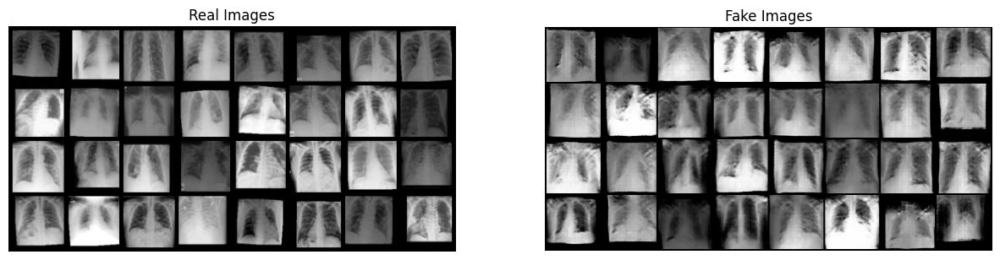

In [ ]:
visualize_generated_imgs(generator, discriminator, num_epochs, metrics, selected_loader)

# **Generator and Discriminator Summary**

In [ ]:
from torchsummary import summary

summary(generator, (100, 1, 1))
summary(discriminator, (1, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 4]         819,200
       BatchNorm2d-2            [-1, 512, 4, 4]           1,024
              ReLU-3            [-1, 512, 4, 4]               0
   ConvTranspose2d-4            [-1, 256, 8, 8]       2,097,152
       BatchNorm2d-5            [-1, 256, 8, 8]             512
              ReLU-6            [-1, 256, 8, 8]               0
   ConvTranspose2d-7          [-1, 128, 16, 16]         524,288
       BatchNorm2d-8          [-1, 128, 16, 16]             256
              ReLU-9          [-1, 128, 16, 16]               0
  ConvTranspose2d-10           [-1, 64, 32, 32]         131,072
      BatchNorm2d-11           [-1, 64, 32, 32]             128
             ReLU-12           [-1, 64, 32, 32]               0
  ConvTranspose2d-13            [-1, 1, 64, 64]           1,024
             Tanh-14            [-1, 1,

In [ ]:
print(generator)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [ ]:
print(discriminator)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Dropout(p=0.5, inplace=False)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Dropout(p=0.5, inplace=False)
    (10): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (11): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): Dropout(p=0.25, inplace=False)
    (13): LeakyReLU(negative_slope=0.2, inplace=True)
    (14

# **Classification**

In [ ]:
!pip install torch-summary

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torchsummary import summary
import torch.optim as optim
import os
from tqdm import notebook
from sklearn.metrics import classification_report, confusion_matrix
from tabulate import tabulate
import gc
import datetime as dt
from IPython.display import clear_output

# **Define Metrics**

This function provides a convenient way to **visualize the performance of a classification model using a confusion matrix**. It helps in understanding how well the model is predicting different classes and identifying any patterns of misclassifications.

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from sklearn.utils.multiclass import unique_labels


def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    else:
        pass
        #print('Confusion matrix, without normalization')

    #print(cm)
    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    ax.set_ylim(len(classes)-0.5, -0.5)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

This function is commonly used to **visualize images** in the context of machine learning tasks, such as **displaying training or testing batches** of images. The ability to save the images can be useful for generating visualizations or saving image samples during model training.

In [ ]:
def imshow(img,type_=None,path=None):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    img_=np.transpose(npimg, (1, 2, 0))
    if img_.shape[2]==1:
      img_=img_[:,:,0]
    plt.axis('off')
    if type_=='train':
      plt.title('Train Batch')
    else:
      if type_=='test':
        plt.title('Test Batch')
    plt.imshow(img_, cmap='gray')
    if not path == None:
      plt.savefig(path)
    plt.show()

# **Define Model**

This code defines a CNN model with multiple convolutional layers followed by dense layers for image classification. The forward method specifies the forward pass through the network, and the _build_models method constructs the layers of the CNN.

In [ ]:
class CNN(nn.Module):

    def _name(self):
        return "CNN"

    def _conv2d(self, in_channels, out_channels):
        return nn.Conv2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=3,
            padding=1
        )

    def _build_models(self):
        self.conv1 = nn.Sequential(
            self._conv2d(self.channels_size, self.hidden_size),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(self.hidden_size),
            nn.MaxPool2d(2, 2)
        )
        self.conv2 = nn.Sequential(
            self._conv2d(self.hidden_size , self.hidden_size * 2),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(self.hidden_size * 2),
            nn.MaxPool2d(2, 2)
        )
        self.conv3 = nn.Sequential(
            self._conv2d(self.hidden_size*2, self.hidden_size * 4),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(self.hidden_size * 4),
            nn.MaxPool2d(2, 2)
        )
        self.dense = nn.Sequential(
            nn.Flatten(),
            nn.Linear(int(self.hidden_size * 4 * img_dim/8 * img_dim/8), img_dim*4),
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(img_dim*4, class_number),
            nn.Softmax(dim=1)
        )
        return self.conv1, self.conv2, self.conv3, self.dense

    def __init__(self, hidden_size, channels_size, class_number):
        super().__init__()
        self.hidden_size = hidden_size
        self.channels_size = channels_size
        self.class_number = class_number
        self._models = self._build_models()
        self.name = self._name()

    def forward(self, image):
        x = self._models[0](image)
        x_1 = self._models[1](x)
        x_2 = self._models[2](x_1)
        x_3 = self._models[3](x_2)
        return x_3

These variables and data structures provide the necessary configuration for training a CNN model and monitoring its performance using various metrics.

In [ ]:
# Define the size of the hidden layer in the CNN
hidden_size = 32
# Define the number of channels in the input image
channels_size = 1
# Define the number of output classes for classification
class_number = 4
# Define the list of metric fields for tracking during training
METRIC_FIELDS = ['loss', 'tot_acc', 'acc', 'sens', 'spec', 'f1_score']
# Create an empty dictionary to store the metrics for each field
metrics = {field: list() for field in METRIC_FIELDS}
# Define the number of epochs for training
epochs = 300
# Define the learning rate for the optimizer
lr = 0.01
# Define the momentum for the optimizer
m = 0.9

# **Define Dataloader**

This code segment prepares the necessary data structures and utilities to handle the training and testing data for an image classification model.

In [ ]:
# Define batch sizes for training and testing
batch_size_train = 256
batch_size_test = 36

# Define the number of samples per batch (used for the sampler)
num_samples = batch_size_train

# Define the dimension of the input images
img_dim = 64

# Define the directory paths for the dataset
data_dir = '/content/Xray_dataset/'
original_train_dir = 'train/'
train_classic_augmented_dir = 'train_classic/'
train_synthetic_augmented_dir = 'train_synthetic/'
test_dir = 'test/'

# Define the image transformations to be applied
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5))
])

# Create datasets for original train images
trainset0 = torchvision.datasets.ImageFolder(os.path.join(data_dir, original_train_dir), transform=transform)

# Create datasets for classic augmented train images
trainset500 = torchvision.datasets.ImageFolder(os.path.join(data_dir+train_classic_augmented_dir, "500/"), transform=transform)
trainset1000 = torchvision.datasets.ImageFolder(os.path.join(data_dir+train_classic_augmented_dir, "1000/"), transform=transform)
trainset2000 = torchvision.datasets.ImageFolder(os.path.join(data_dir+train_classic_augmented_dir, "2000/"), transform=transform)
trainset3000 = torchvision.datasets.ImageFolder(os.path.join(data_dir+train_classic_augmented_dir, "3000/"), transform=transform)

# Create datasets for GAN augmented train images
trainset100_gan = torchvision.datasets.ImageFolder(os.path.join(data_dir+train_synthetic_augmented_dir, "100/"), transform=transform)
trainset500_gan = torchvision.datasets.ImageFolder(os.path.join(data_dir+train_synthetic_augmented_dir, "500/"), transform=transform)
trainset1000_gan = torchvision.datasets.ImageFolder(os.path.join(data_dir+train_synthetic_augmented_dir, "1000/"), transform=transform)
trainset2000_gan = torchvision.datasets.ImageFolder(os.path.join(data_dir+train_synthetic_augmented_dir, "2000/"), transform=transform)

# Create lists to concatenate the train datasets
listtrainset_no_aug = [trainset0]
listtrainset_classic = [trainset500, trainset1000]
listtrainset_gan = [trainset100_gan, trainset500_gan, trainset1000_gan, trainset2000_gan]

# Concatenate the train datasets
# listtrainset = listtrainset_no_aug + listtrainset_classic + listtrainset_gan
# trainset_concat = torch.utils.data.ConcatDataset(listtrainset)

# Define a sampler to sample from the concatenated train dataset
# sampler = torch.utils.data.RandomSampler(trainset_concat, replacement=True, num_samples=num_samples)

# Create a data loader for the concatenated train dataset
# trainloader = torch.utils.data.DataLoader(trainset_concat, sampler=sampler,
#                                           batch_size=batch_size_train, drop_last=True)

# Create a test dataset
testset0 = torchvision.datasets.ImageFolder(os.path.join(data_dir, test_dir), transform=transform)

# Create a data loader for the test dataset
testloader = torch.utils.data.DataLoader(testset0, batch_size=batch_size_test, shuffle=False)

# Define the classes for classification
classes = ("covid", "normal", "pneumonia_bac", "pneumonia_vir")


We set up the model, the loss criterion, and the optimizer required to train the CNN model for a specific classification task.

In [ ]:
# Initialize the CNN model
net = CNN(hidden_size, channels_size, class_number)
# Define the loss criterion
criterion = nn.CrossEntropyLoss()
# Define the optimizer
optimizer = optim.SGD(net.parameters(), lr=lr, momentum=m)


This code segment sets up a new folder structure to organize the results of the CNN model training, creating the necessary directories for storing plots and models.

In [ ]:
# Define the name of the new folder based on various parameters and current time
name_new_folder = 'CNN_'+str(channels_size)+'CH_O'+str(len(listtrainset_no_aug))+'+C'+str(len(listtrainset_classic))+'+G'+str(len(listtrainset_gan))+'_batch'+str(batch_size_train)+'_lr'+str(lr)+'_{}'.format(dt.datetime.now())
# Print the name of the new folder
print('NEW FOLDER: ', name_new_folder)
# Specify the results folder where the new folder will be created
results_folder = 'results/'
# Create the results folder and subdirectories using lambda functions
for func in [lambda: os.mkdir(os.path.join('.', results_folder)),
             lambda: os.mkdir(os.path.join('.', results_folder + name_new_folder +'/')),
             lambda: os.mkdir(os.path.join('.', results_folder + name_new_folder +'/plots/')),
             lambda: os.mkdir(os.path.join('.', results_folder + name_new_folder +'/models/'))]:
    try:
        func()
    except Exception as error:
        print(error)
        continue


NEW FOLDER:  CNN_1CH_O1+C2+G4_batch256_lr0.01_2023-06-04 14:50:47.526502
[Errno 17] File exists: './results/'


This code segment prepares the CNN model for training, sets up the necessary components, and generates a visual summary of the model architecture.

In [ ]:
# Initialize the CNN model and move it to the GPU if available
net = CNN(hidden_size, channels_size, class_number).cuda()
# Define the criterion (loss function) for training
criterion = nn.CrossEntropyLoss()
# Define the optimizer for updating the model parameters
optimizer = optim.SGD(net.parameters(), lr=lr, momentum=m)
# Set the device to be used for training (GPU if available, otherwise CPU)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
net.to(device)
# Generate a summary of the model architecture
model_stats = summary(net, (channels_size, img_dim, img_dim))
summary_str = str(model_stats)
# Plot and save the model summary
plt.figure(figsize=(12,7))
plt.text(0.01, 0.05, summary_str, {'fontsize': 10}, fontproperties='monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig(results_folder + name_new_folder + '/plots/model_summary.png')

# **Visaulization**

This code segment allows you to v**isualize and verify the test batch of images** and their **ground truth labels**.

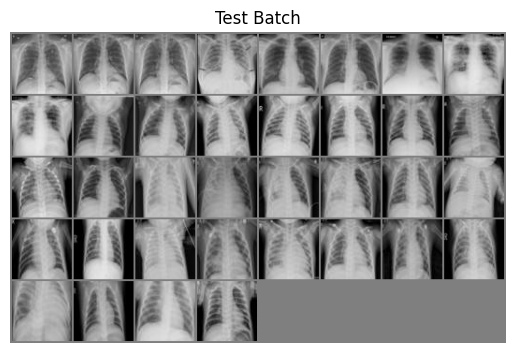

GroundTruth:  covid covid covid covid covid covid covid covid covid normal normal normal normal normal normal normal normal normal pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_bac pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir pneumonia_vir


In [ ]:
# Obtain an iterator for the testloader
dataiter = iter(testloader)
# Get a batch of test images and labels
images_test, labels_test = next(dataiter)
# Visualize and save the test batch of images
imshow(torchvision.utils.make_grid(images_test), type_='test', path=results_folder + name_new_folder + '/plots/test_batch.png')
# Print the ground truth labels
print('GroundTruth:', ' '.join('%5s' % classes[labels_test[j]] for j in range(batch_size_test)))


# **Train The Model Without Synthetic images**

Train a Convolutional Neural Network (CNN) model for classifying X-ray images of COVID-19 without synthetic images

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [1]  => Loss: [1.399]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [2]  => Loss: [1.389]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [3]  => Loss: [1.383]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [4]  => Loss: [1.375]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [5]  => Loss: [1.353]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [6]  => Loss: [1.335]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [7]  => Loss: [1.331]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [8]  => Loss: [1.302]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [9]  => Loss: [1.301]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [10]  => Loss: [1.268]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [10]  => Confusion Matrix Test: [1]  => Total Accuracy over 1800 samples: [0.516]


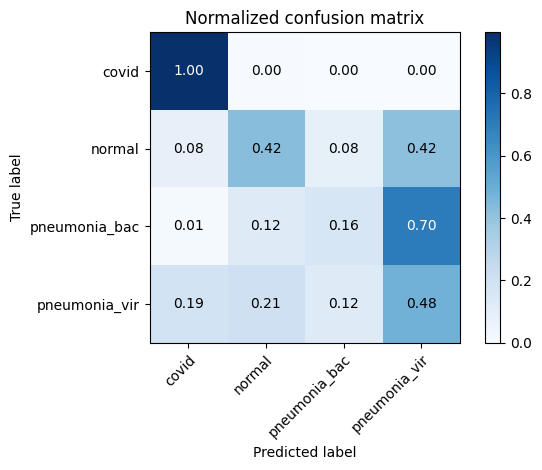

Epoch: [10]  => Evaluation Confusion Matrix Test: [1]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [11]  => Loss: [1.234]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [12]  => Loss: [1.197]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [13]  => Loss: [1.207]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [14]  => Loss: [1.201]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [15]  => Loss: [1.172]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [16]  => Loss: [1.140]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [17]  => Loss: [1.159]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [18]  => Loss: [1.107]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [19]  => Loss: [1.182]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [20]  => Loss: [1.148]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [20]  => Confusion Matrix Test: [2]  => Total Accuracy over 1800 samples: [0.600]


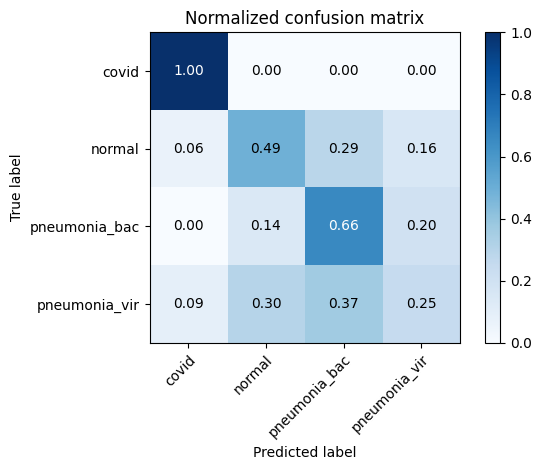

Epoch: [20]  => Evaluation Confusion Matrix Test: [2]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [21]  => Loss: [1.133]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [22]  => Loss: [1.115]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [23]  => Loss: [1.122]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [24]  => Loss: [1.096]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [25]  => Loss: [1.107]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [26]  => Loss: [1.108]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [27]  => Loss: [1.106]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [28]  => Loss: [1.117]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [29]  => Loss: [1.077]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [30]  => Loss: [1.080]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [30]  => Confusion Matrix Test: [3]  => Total Accuracy over 1800 samples: [0.629]


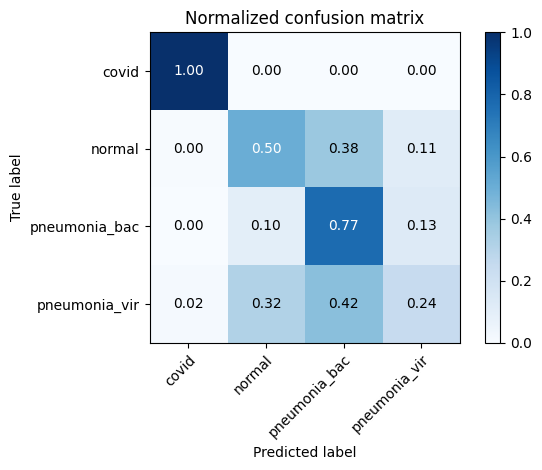

Epoch: [30]  => Evaluation Confusion Matrix Test: [3]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [31]  => Loss: [1.069]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [32]  => Loss: [1.102]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [33]  => Loss: [1.054]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [34]  => Loss: [1.080]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [35]  => Loss: [1.011]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [36]  => Loss: [1.065]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [37]  => Loss: [1.058]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [38]  => Loss: [1.024]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [39]  => Loss: [1.048]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [40]  => Loss: [1.078]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [40]  => Confusion Matrix Test: [4]  => Total Accuracy over 1800 samples: [0.635]


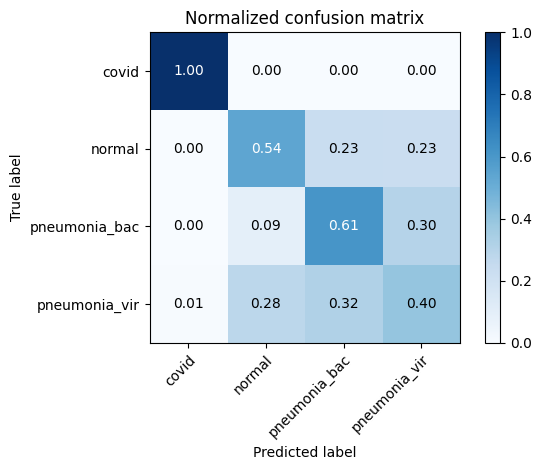

Epoch: [40]  => Evaluation Confusion Matrix Test: [4]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [41]  => Loss: [1.014]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [42]  => Loss: [1.077]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [43]  => Loss: [1.089]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [44]  => Loss: [1.004]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [45]  => Loss: [1.065]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [46]  => Loss: [1.059]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [47]  => Loss: [1.049]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [48]  => Loss: [0.992]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [49]  => Loss: [1.018]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [50]  => Loss: [1.013]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [50]  => Confusion Matrix Test: [5]  => Total Accuracy over 1800 samples: [0.677]


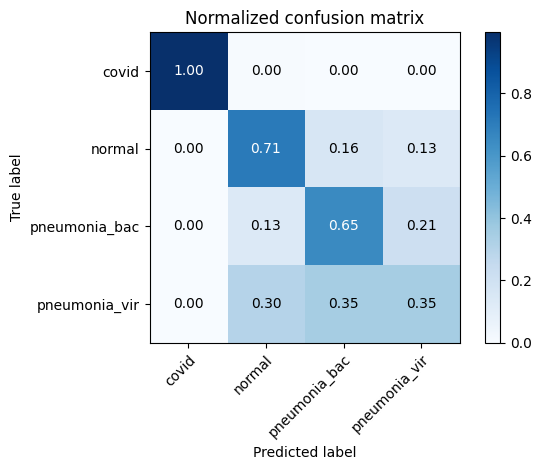

Epoch: [50]  => Evaluation Confusion Matrix Test: [5]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [51]  => Loss: [1.017]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [52]  => Loss: [1.008]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [53]  => Loss: [1.018]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [54]  => Loss: [1.029]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [55]  => Loss: [0.999]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [56]  => Loss: [1.056]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [57]  => Loss: [1.017]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [58]  => Loss: [1.018]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [59]  => Loss: [1.051]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [60]  => Loss: [0.999]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [60]  => Confusion Matrix Test: [6]  => Total Accuracy over 1800 samples: [0.705]


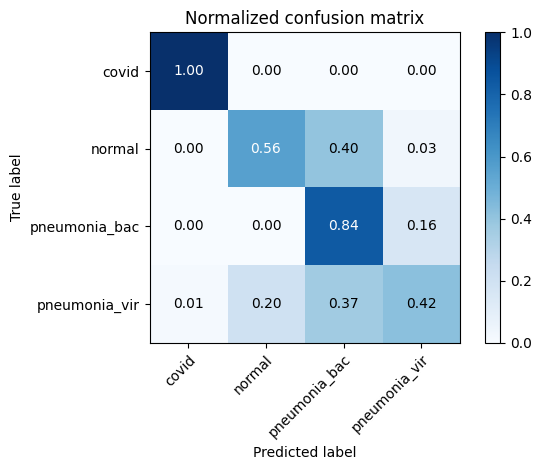

Epoch: [60]  => Evaluation Confusion Matrix Test: [6]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [61]  => Loss: [0.990]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [62]  => Loss: [1.016]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [63]  => Loss: [0.978]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [64]  => Loss: [0.993]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [65]  => Loss: [1.001]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [66]  => Loss: [1.006]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [67]  => Loss: [0.967]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [68]  => Loss: [1.031]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [69]  => Loss: [0.936]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [70]  => Loss: [0.985]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [70]  => Confusion Matrix Test: [7]  => Total Accuracy over 1800 samples: [0.719]


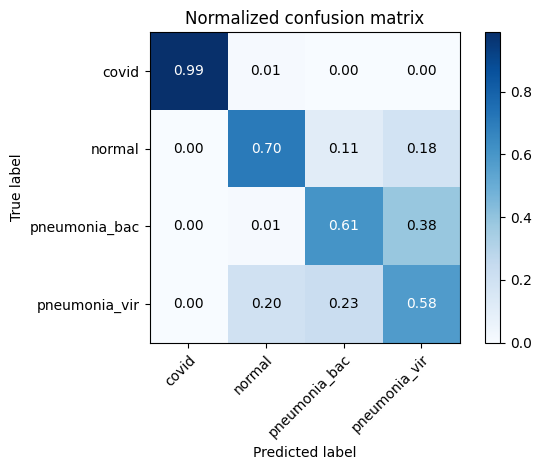

Epoch: [70]  => Evaluation Confusion Matrix Test: [7]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [71]  => Loss: [0.970]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [72]  => Loss: [0.957]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [73]  => Loss: [0.968]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [74]  => Loss: [0.954]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [75]  => Loss: [0.941]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [76]  => Loss: [0.965]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [77]  => Loss: [0.986]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [78]  => Loss: [0.953]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [79]  => Loss: [0.968]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [80]  => Loss: [0.944]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [80]  => Confusion Matrix Test: [8]  => Total Accuracy over 1800 samples: [0.731]


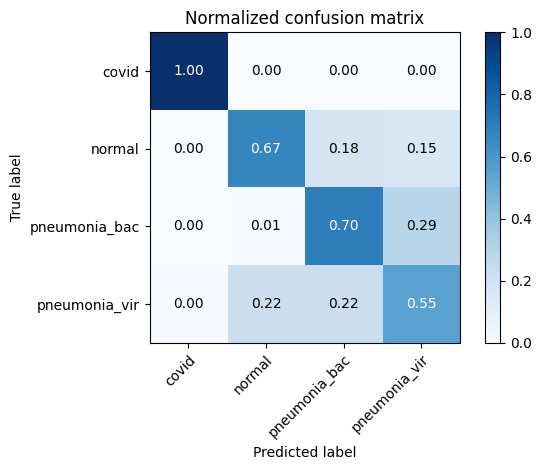

Epoch: [80]  => Evaluation Confusion Matrix Test: [8]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [81]  => Loss: [0.962]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [82]  => Loss: [0.980]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [83]  => Loss: [0.947]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [84]  => Loss: [0.950]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [85]  => Loss: [0.940]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [86]  => Loss: [0.960]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [87]  => Loss: [0.984]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [88]  => Loss: [1.003]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [89]  => Loss: [0.951]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [90]  => Loss: [0.968]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [90]  => Confusion Matrix Test: [9]  => Total Accuracy over 1800 samples: [0.686]


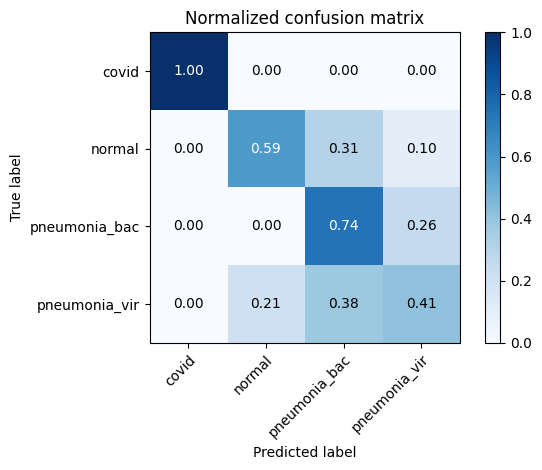

Epoch: [90]  => Evaluation Confusion Matrix Test: [9]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [91]  => Loss: [0.988]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [92]  => Loss: [0.964]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [93]  => Loss: [0.979]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [94]  => Loss: [1.008]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [95]  => Loss: [0.963]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [96]  => Loss: [0.968]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [97]  => Loss: [0.920]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [98]  => Loss: [0.941]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [99]  => Loss: [0.950]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [100]  => Loss: [0.904]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [100]  => Confusion Matrix Test: [10]  => Total Accuracy over 1800 samples: [0.751]


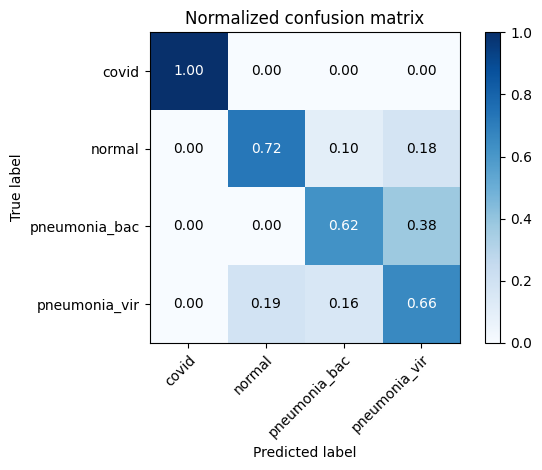

Epoch: [100]  => Evaluation Confusion Matrix Test: [10]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [101]  => Loss: [0.950]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [102]  => Loss: [0.924]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [103]  => Loss: [0.922]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [104]  => Loss: [0.960]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [105]  => Loss: [0.910]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [106]  => Loss: [0.904]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [107]  => Loss: [0.943]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [108]  => Loss: [0.966]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [109]  => Loss: [0.911]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [110]  => Loss: [0.972]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [110]  => Confusion Matrix Test: [11]  => Total Accuracy over 1800 samples: [0.722]


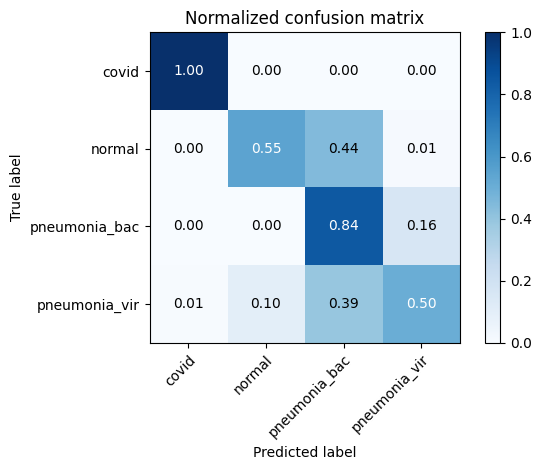

Epoch: [110]  => Evaluation Confusion Matrix Test: [11]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [111]  => Loss: [0.948]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [112]  => Loss: [0.959]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [113]  => Loss: [0.939]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [114]  => Loss: [0.918]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [115]  => Loss: [0.907]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [116]  => Loss: [0.917]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [117]  => Loss: [0.920]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [118]  => Loss: [0.951]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [119]  => Loss: [0.937]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [120]  => Loss: [0.924]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [120]  => Confusion Matrix Test: [12]  => Total Accuracy over 1800 samples: [0.693]


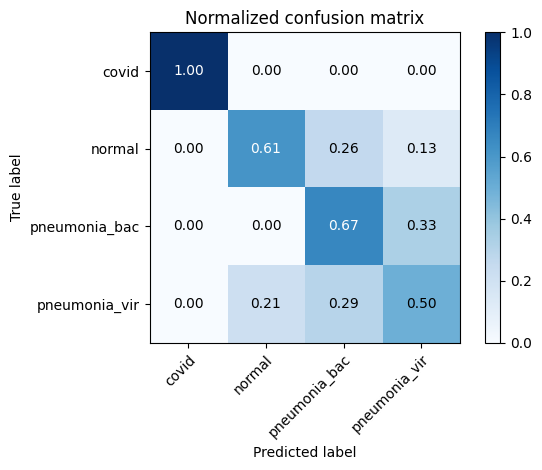

Epoch: [120]  => Evaluation Confusion Matrix Test: [12]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [121]  => Loss: [0.939]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [122]  => Loss: [0.914]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [123]  => Loss: [0.948]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [124]  => Loss: [0.933]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [125]  => Loss: [0.925]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [126]  => Loss: [0.987]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [127]  => Loss: [0.934]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [128]  => Loss: [0.928]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [129]  => Loss: [0.930]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [130]  => Loss: [0.901]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [130]  => Confusion Matrix Test: [13]  => Total Accuracy over 1800 samples: [0.692]


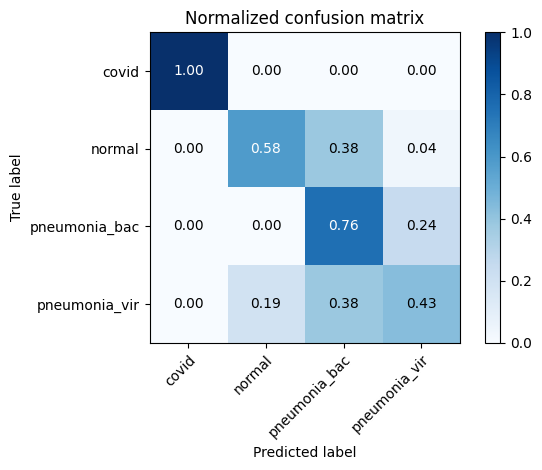

Epoch: [130]  => Evaluation Confusion Matrix Test: [13]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [131]  => Loss: [0.934]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [132]  => Loss: [0.927]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [133]  => Loss: [0.930]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [134]  => Loss: [0.922]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [135]  => Loss: [0.896]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [136]  => Loss: [0.922]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [137]  => Loss: [0.933]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [138]  => Loss: [0.933]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [139]  => Loss: [0.949]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [140]  => Loss: [0.942]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [140]  => Confusion Matrix Test: [14]  => Total Accuracy over 1800 samples: [0.754]


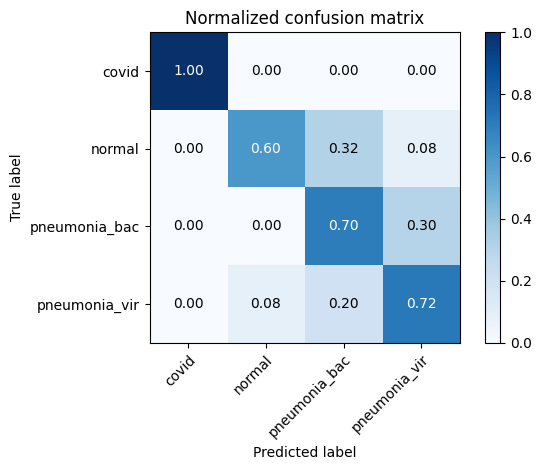

Epoch: [140]  => Evaluation Confusion Matrix Test: [14]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [141]  => Loss: [0.898]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [142]  => Loss: [0.900]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [143]  => Loss: [0.910]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [144]  => Loss: [0.949]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [145]  => Loss: [0.909]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [146]  => Loss: [0.943]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [147]  => Loss: [0.904]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [148]  => Loss: [0.913]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [149]  => Loss: [0.916]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [150]  => Loss: [0.879]


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: [150]  => Confusion Matrix Test: [15]  => Total Accuracy over 18000 samples: [0.757]


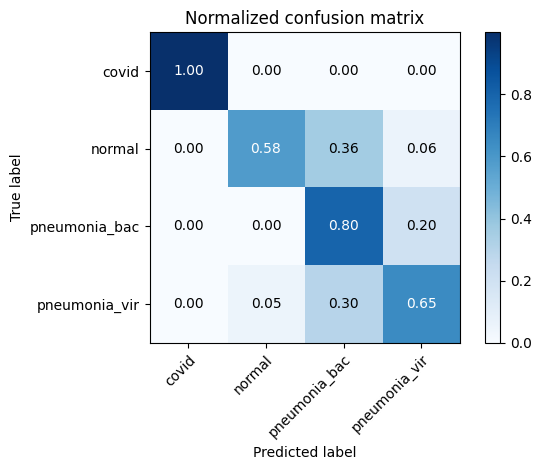

Epoch: [150]  => Evaluation Confusion Matrix Test: [15]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_150_ep_0.757_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.882 │         0.58  │         0.982 │     0.724 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.786 │         0.798 │         0.782 │     0.787 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.846 │         0.65  │         0.912 │     0.752 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [151]  => Loss: [0.942]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [152]  => Loss: [0.895]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [153]  => Loss: [0.885]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [154]  => Loss: [0.866]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [155]  => Loss: [0.904]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [156]  => Loss: [0.914]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [157]  => Loss: [0.884]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [158]  => Loss: [0.937]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [159]  => Loss: [0.885]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [160]  => Loss: [0.883]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [160]  => Confusion Matrix Test: [16]  => Total Accuracy over 1800 samples: [0.766]


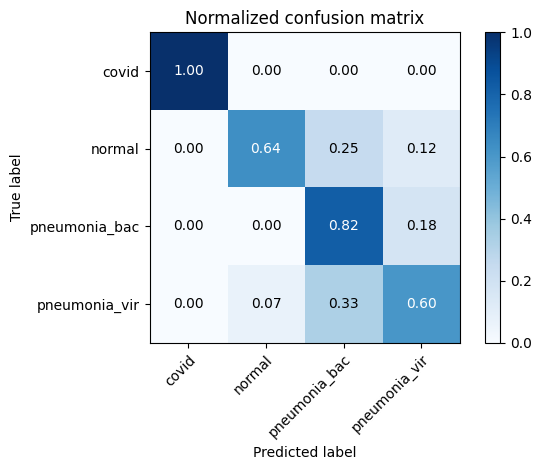

Epoch: [160]  => Evaluation Confusion Matrix Test: [16]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [161]  => Loss: [0.919]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [162]  => Loss: [0.931]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [163]  => Loss: [0.911]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [164]  => Loss: [0.875]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [165]  => Loss: [0.875]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [166]  => Loss: [0.833]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [167]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [168]  => Loss: [0.867]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [169]  => Loss: [0.885]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [170]  => Loss: [0.902]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [170]  => Confusion Matrix Test: [17]  => Total Accuracy over 1800 samples: [0.789]


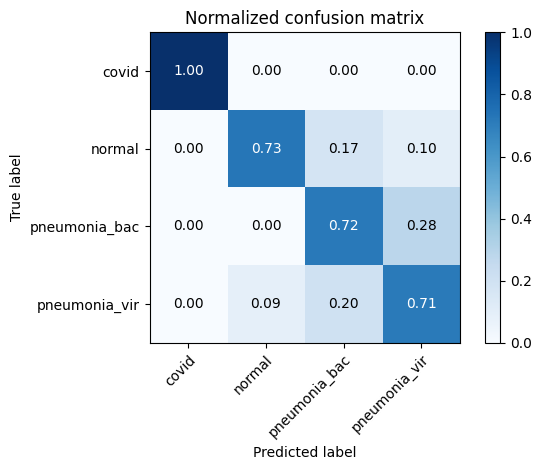

Epoch: [170]  => Evaluation Confusion Matrix Test: [17]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [171]  => Loss: [0.899]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [172]  => Loss: [0.880]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [173]  => Loss: [0.907]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [174]  => Loss: [0.849]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [175]  => Loss: [0.884]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [176]  => Loss: [0.858]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [177]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [178]  => Loss: [0.900]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [179]  => Loss: [0.871]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [180]  => Loss: [0.881]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [180]  => Confusion Matrix Test: [18]  => Total Accuracy over 1800 samples: [0.782]


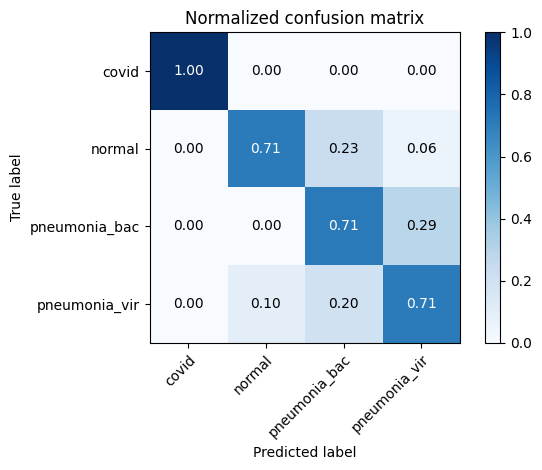

Epoch: [180]  => Evaluation Confusion Matrix Test: [18]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [181]  => Loss: [0.866]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [182]  => Loss: [0.866]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [183]  => Loss: [0.901]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [184]  => Loss: [0.866]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [185]  => Loss: [0.874]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [186]  => Loss: [0.896]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [187]  => Loss: [0.863]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [188]  => Loss: [0.914]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [189]  => Loss: [0.884]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [190]  => Loss: [0.882]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [190]  => Confusion Matrix Test: [19]  => Total Accuracy over 1800 samples: [0.758]


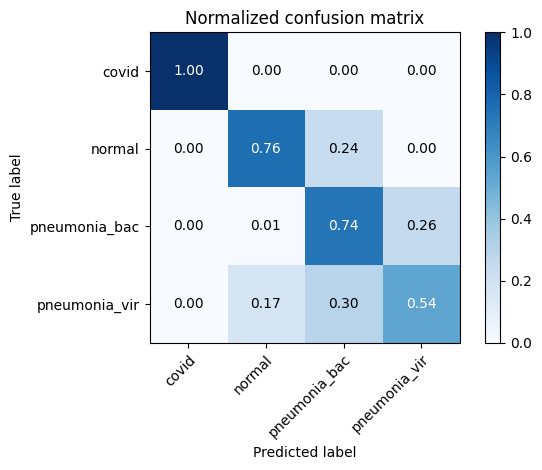

Epoch: [190]  => Evaluation Confusion Matrix Test: [19]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [191]  => Loss: [0.893]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [192]  => Loss: [0.893]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [193]  => Loss: [0.850]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [194]  => Loss: [0.877]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [195]  => Loss: [0.887]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [196]  => Loss: [0.861]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [197]  => Loss: [0.887]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [198]  => Loss: [0.878]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [199]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [200]  => Loss: [0.899]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [200]  => Confusion Matrix Test: [20]  => Total Accuracy over 1800 samples: [0.742]


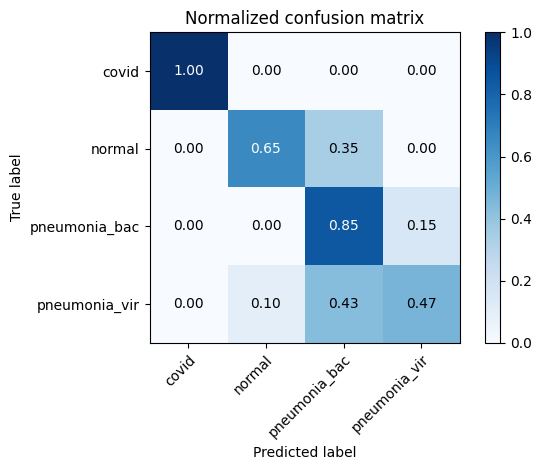

Epoch: [200]  => Evaluation Confusion Matrix Test: [20]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [201]  => Loss: [0.903]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [202]  => Loss: [0.886]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [203]  => Loss: [0.923]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [204]  => Loss: [0.871]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [205]  => Loss: [0.843]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [206]  => Loss: [0.901]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [207]  => Loss: [0.896]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [208]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [209]  => Loss: [0.904]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [210]  => Loss: [0.900]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [210]  => Confusion Matrix Test: [21]  => Total Accuracy over 1800 samples: [0.758]


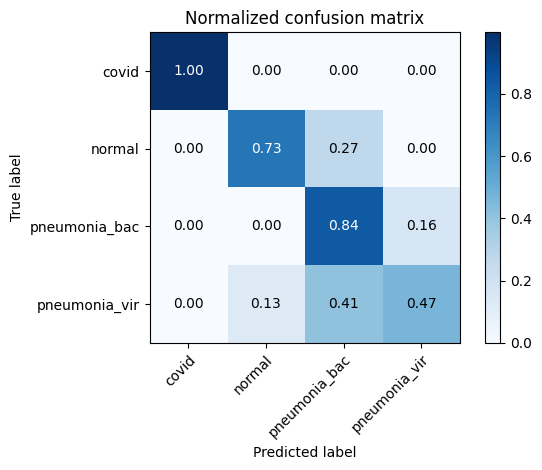

Epoch: [210]  => Evaluation Confusion Matrix Test: [21]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [211]  => Loss: [0.905]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [212]  => Loss: [0.846]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [213]  => Loss: [0.840]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [214]  => Loss: [0.892]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [215]  => Loss: [0.860]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [216]  => Loss: [0.862]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [217]  => Loss: [0.856]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [218]  => Loss: [0.847]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [219]  => Loss: [0.845]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [220]  => Loss: [0.896]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [220]  => Confusion Matrix Test: [22]  => Total Accuracy over 1800 samples: [0.773]


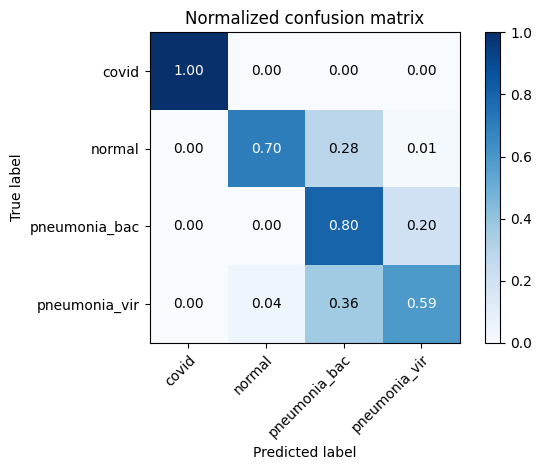

Epoch: [220]  => Evaluation Confusion Matrix Test: [22]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [221]  => Loss: [0.858]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [222]  => Loss: [0.868]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [223]  => Loss: [0.862]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [224]  => Loss: [0.845]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [225]  => Loss: [0.888]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [226]  => Loss: [0.867]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [227]  => Loss: [0.842]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [228]  => Loss: [0.869]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [229]  => Loss: [0.873]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [230]  => Loss: [0.848]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [230]  => Confusion Matrix Test: [23]  => Total Accuracy over 1800 samples: [0.805]


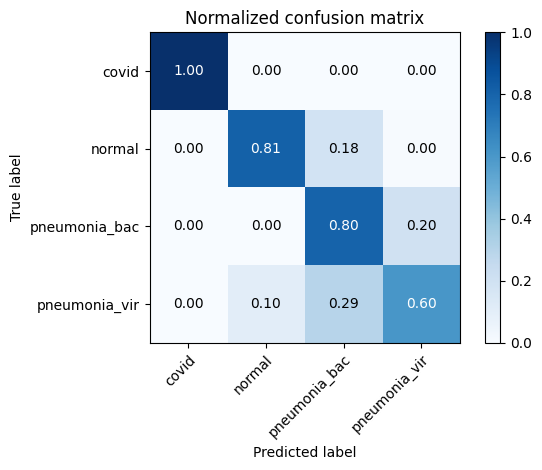

Epoch: [230]  => Evaluation Confusion Matrix Test: [23]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [231]  => Loss: [0.873]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [232]  => Loss: [0.874]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [233]  => Loss: [0.887]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [234]  => Loss: [0.853]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [235]  => Loss: [0.830]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [236]  => Loss: [0.863]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [237]  => Loss: [0.889]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [238]  => Loss: [0.863]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [239]  => Loss: [0.882]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [240]  => Loss: [0.888]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [240]  => Confusion Matrix Test: [24]  => Total Accuracy over 1800 samples: [0.781]


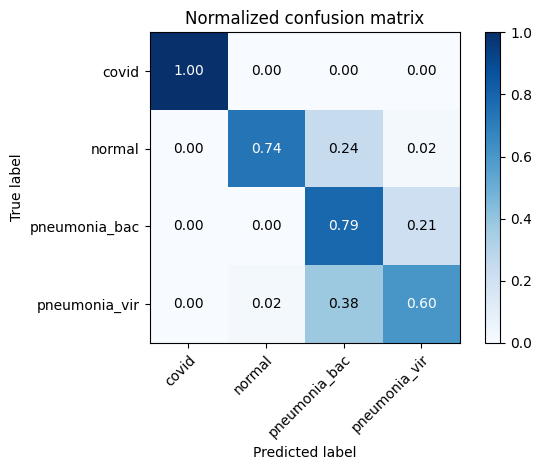

Epoch: [240]  => Evaluation Confusion Matrix Test: [24]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [241]  => Loss: [0.810]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [242]  => Loss: [0.841]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [243]  => Loss: [0.854]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [244]  => Loss: [0.829]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [245]  => Loss: [0.866]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [246]  => Loss: [0.826]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [247]  => Loss: [0.865]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [248]  => Loss: [0.869]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [249]  => Loss: [0.853]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [250]  => Loss: [0.831]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [250]  => Confusion Matrix Test: [25]  => Total Accuracy over 1800 samples: [0.761]


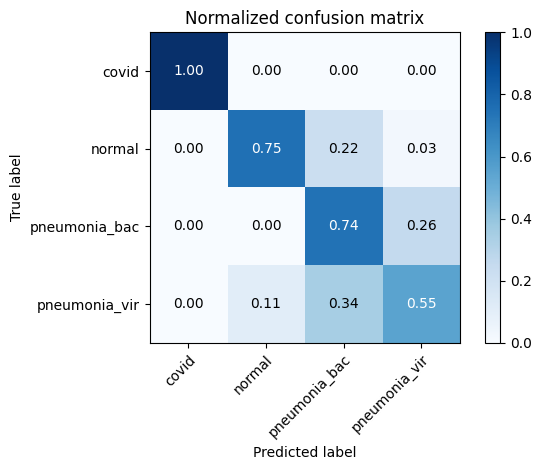

Epoch: [250]  => Evaluation Confusion Matrix Test: [25]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [251]  => Loss: [0.835]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [252]  => Loss: [0.874]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [253]  => Loss: [0.847]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [254]  => Loss: [0.834]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [255]  => Loss: [0.839]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [256]  => Loss: [0.847]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [257]  => Loss: [0.850]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [258]  => Loss: [0.834]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [259]  => Loss: [0.822]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [260]  => Loss: [0.832]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [260]  => Confusion Matrix Test: [26]  => Total Accuracy over 1800 samples: [0.796]


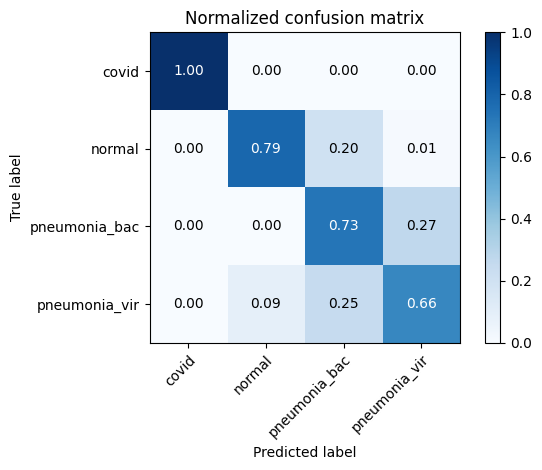

Epoch: [260]  => Evaluation Confusion Matrix Test: [26]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [261]  => Loss: [0.842]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [262]  => Loss: [0.821]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [263]  => Loss: [0.852]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [264]  => Loss: [0.830]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [265]  => Loss: [0.853]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [266]  => Loss: [0.802]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [267]  => Loss: [0.839]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [268]  => Loss: [0.820]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [269]  => Loss: [0.825]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [270]  => Loss: [0.834]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [270]  => Confusion Matrix Test: [27]  => Total Accuracy over 1800 samples: [0.813]


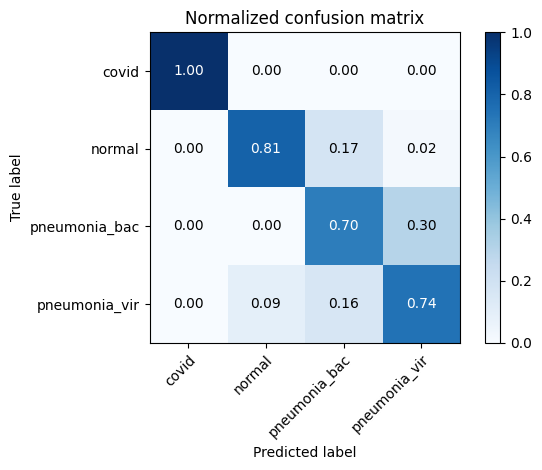

Epoch: [270]  => Evaluation Confusion Matrix Test: [27]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [271]  => Loss: [0.815]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [272]  => Loss: [0.824]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [273]  => Loss: [0.834]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [274]  => Loss: [0.822]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [275]  => Loss: [0.829]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [276]  => Loss: [0.825]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [277]  => Loss: [0.822]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [278]  => Loss: [0.822]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [279]  => Loss: [0.823]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [280]  => Loss: [0.830]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [280]  => Confusion Matrix Test: [28]  => Total Accuracy over 1800 samples: [0.798]


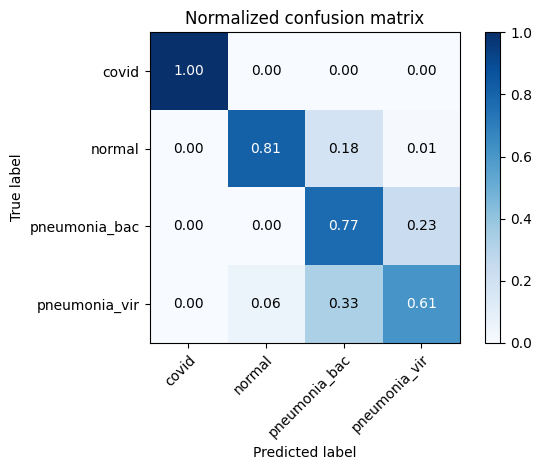

Epoch: [280]  => Evaluation Confusion Matrix Test: [28]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [281]  => Loss: [0.802]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [282]  => Loss: [0.832]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [283]  => Loss: [0.838]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [284]  => Loss: [0.842]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [285]  => Loss: [0.851]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [286]  => Loss: [0.850]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [287]  => Loss: [0.824]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [288]  => Loss: [0.820]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [289]  => Loss: [0.807]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [290]  => Loss: [0.836]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [290]  => Confusion Matrix Test: [29]  => Total Accuracy over 1800 samples: [0.770]


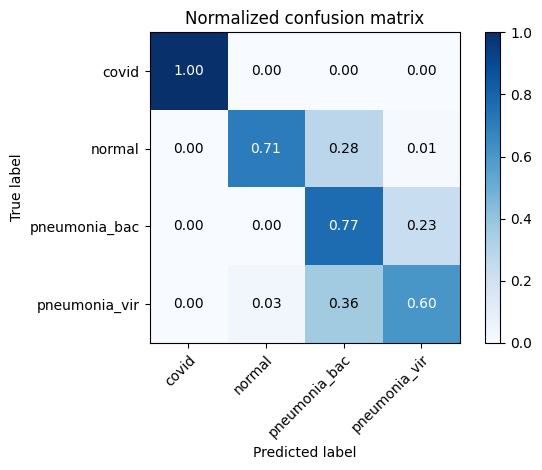

Epoch: [290]  => Evaluation Confusion Matrix Test: [29]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [291]  => Loss: [0.830]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [292]  => Loss: [0.829]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [293]  => Loss: [0.828]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [294]  => Loss: [0.808]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [295]  => Loss: [0.819]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [296]  => Loss: [0.823]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [297]  => Loss: [0.832]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [298]  => Loss: [0.818]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [299]  => Loss: [0.833]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [300]  => Loss: [0.824]


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: [300]  => Confusion Matrix Test: [30]  => Total Accuracy over 18000 samples: [0.766]


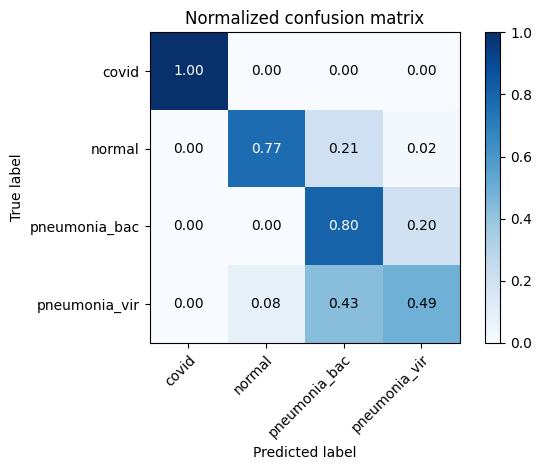

Epoch: [300]  => Evaluation Confusion Matrix Test: [30]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_300_ep_0.766_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.921 │         0.768 │         0.973 │     0.857 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.792 │         0.805 │         0.788 │     0.794 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.818 │         0.491 │         0.927 │     0.634 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

In [ ]:
# Create the CNN model and move it to the GPU
net = CNN(hidden_size, channels_size, class_number).cuda()
# Define the criterion for calculating the loss
criterion = nn.CrossEntropyLoss()
# Initialize the optimizer as SGD with the specified learning rate and momentum
optimizer = optim.SGD(net.parameters(), lr=lr, momentum=m)
# Combine the training datasets
listtrainset = listtrainset_no_aug + listtrainset_classic
# Create a concatenated dataset from the training datasets
trainset_concat = torch.utils.data.ConcatDataset(listtrainset)
# Create a sampler that randomly samples with replacement from the concatenated dataset
sampler = torch.utils.data.RandomSampler(trainset_concat, replacement=True, num_samples=num_samples)
# Create the DataLoader for training
trainloader = torch.utils.data.DataLoader(trainset_concat, sampler=sampler,
                                          batch_size=batch_size_train, drop_last=True)

for epoch in range(epochs):  # loop over the dataset multiple times
    running_loss = 0.0
    for data in notebook.tqdm(trainloader):
        # get the inputs; data is a list of [inputs, labels]
        gc.collect()
        if torch.cuda.is_available():
            inputs, labels = data[0].cuda(), data[1].cuda()
        else:
            inputs, labels = data[0].to(device), data[1].to(device)
        
        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
    print("Epoch: [%d]"%(epoch + 1),' => Loss: [%.3f]' %(running_loss / len(trainloader)))
    if (epoch+1)%10==0:
        with torch.no_grad():
            metrics['loss'].append([epoch+1, (running_loss / len(trainloader))])
            accuracy_tot = list(0. for i in range(len(classes)))
            sensitivity_tot = list(0. for i in range(len(classes)))
            specificity_tot = list(0. for i in range(len(classes)))
            f1score_tot = list(0. for i in range(len(classes)))
            table = list(0. for i in range(len(classes)))
            tot_acc_tot=0

            iterations=50
            if (epoch+1)%150==0:
              iterations=500
  
            labels_tot=np.array([],dtype=np.uint8)
            predicted_tot=np.array([],dtype=np.uint8)

            for i in notebook.tqdm(range(iterations)):

              dataiter = iter(testloader)
              images, labels = next(dataiter)

       

              outputs = net(images.to(device))

              _, predicted = torch.max(outputs, 1)

              labels_tot=np.append(labels_tot,labels.cpu().detach().numpy())
              predicted_tot=np.append(predicted_tot,predicted.cpu().detach().numpy())

              cm = confusion_matrix(labels.cpu().detach().numpy(), predicted.cpu().detach().numpy(), labels=None, sample_weight=None)

              tot_acc=np.trace(cm)/np.sum(cm)

              tot_acc_tot+=tot_acc

              sensitivity = list(0. for i in range(cm.shape[0]))
              specificity = list(0. for i in range(cm.shape[0]))
              accuracy = list(0. for i in range(cm.shape[0]))
              f1score = list(0. for i in range(cm.shape[0]))

              for i in range(cm.shape[0]):
                TP = cm[i,i]
                FN = np.sum(cm[i,:]) - TP
                FP = np.sum(cm[:,i]) - TP
                TN = (np.sum(cm) - TP - FP - FN)
                accuracy[i] = (TP + TN) / (TP + TN + FP + FN) 
                sensitivity[i] = TP / (TP + FN) 
                specificity[i] = TN / (TN + FP) 
                f1score[i]= 2 * (specificity[i] * sensitivity[i]) / (specificity[i] + sensitivity[i])
              accuracy_tot = [sum(x) for x in zip(accuracy_tot, accuracy)]
              specificity_tot = [sum(x) for x in zip(specificity_tot, specificity)]
              sensitivity_tot = [sum(x) for x in zip(sensitivity_tot, sensitivity)]
              f1score_tot = [sum(x) for x in zip(f1score_tot, f1score)]
              
            accuracy_tot = [round((x/iterations),3) for x in accuracy_tot]
            specificity_tot = [round((x/iterations),3) for x in specificity_tot]
            sensitivity_tot = [round((x/iterations),3) for x in sensitivity_tot]
            f1score_tot = [round((x/iterations),3) for x in f1score_tot]
            tot_acc_tot/=iterations
            running_loss/=(iterations*len(testloader))

            metrics['tot_acc'].append([epoch+1, tot_acc_tot])
            metrics['acc'].append([epoch+1, accuracy_tot])
            metrics['spec'].append([epoch+1, specificity_tot])
            metrics['sens'].append([epoch+1, sensitivity_tot])
            metrics['f1_score'].append([epoch+1, f1score_tot])

            table=[classes, accuracy_tot, sensitivity_tot, specificity_tot, f1score_tot]
            table=np.array(table).T.tolist()

            plot_confusion_matrix(labels_tot, predicted_tot, classes=np.asarray(classes), normalize=True)
            
            print("Epoch: [%d]"%(epoch + 1)," => Confusion Matrix Test: [%d]" %(int((epoch+1)/10))," => Total Accuracy over %d samples: [%.3f]" %(len(testloader.dataset)*iterations, tot_acc_tot))

            if (epoch+1)%150==0:
              plt.gcf().savefig( results_folder + name_new_folder +'/plots/confusion_matrix_%d_ep_%.3f_acc.png' % ((epoch + 1),tot_acc_tot))
            
            plt.show()

            print("Epoch: [%d]"%(epoch + 1)," => Evaluation Confusion Matrix Test: [%d]" %(int((epoch+1)/10)))

            tab = tabulate(table, headers=['%d-fold_%d_ep_%.3f_acc' % (len(classes),(epoch + 1),tot_acc_tot),'Accuracy','Sensitivity', 'Specificity', 'F1Score'], tablefmt='fancy_grid')

            if (epoch+1)%150==0:
              # plt.figure(figsize=(8,2.5))
              # plt.text(0.01, 0.05, tab, {'fontsize': 10}, fontproperties = 'monospace') 
              # plt.axis('off')
              # plt.tight_layout()
              # plt.savefig( results_folder + name_new_folder +'/plots/k_fold_%d_ep_%.3f_acc.png' % ((epoch + 1),tot_acc_tot))
              # plt.show()
            # else:
               print(tab)

            if (epoch+1)%150==0:
              PATH = results_folder + name_new_folder +'/models/'
              NAME = 'CNN_XRAY-COVID19_'+str(epoch+1)+'EP_'+str(round(tot_acc_tot,3))+'ACC_O'+str(len(listtrainset_no_aug))+'+C'+str(len(listtrainset_classic))+'+G'+str(len(listtrainset_gan))
              EXT = '.pth'
              states = {
                      'state_dict': net.state_dict(),
                      'optimizer': optimizer.state_dict(),
                      'device': device,
                      'classes': classes,
                      'metrics': metrics,
                      'train_epoch': epoch+1,
                      'dataset_code': 'O'+str(len(listtrainset_no_aug))+'+C'+str(len(listtrainset_classic))+'+G'+str(len(listtrainset_gan)),
                      'dataset_length': len(trainloader.dataset),
                      'batch': num_samples,
                      'mini-batch': batch_size_train,
                      'img_dim': (img_dim,img_dim,channels_size),
                      'date': dt.datetime.now().strftime("%Y-%m-%d_%H:%M:%S"),
              }
              torch.save(states, PATH+NAME+EXT)
              # fig = plt.figure(figsize=(25,15))
              # fig.suptitle(NAME, fontsize=16)
              # fig.subplots_adjust(hspace=0.2, wspace=0.2)
              # for i in range(1, len(METRIC_FIELDS)+1):
              #     ax = fig.add_subplot(2, 3, i)
              #     if type(metrics[METRIC_FIELDS[i-1]][1][1])==list:
              #       for j in range(len(classes)):
              #         ax.plot([x[0] for x in metrics[METRIC_FIELDS[i-1]]],[x[1][j] for x in metrics[METRIC_FIELDS[i-1]]], label=classes[j])
              #       ax.legend()
              #     else:
              #       ax.plot([x[0] for x in metrics[METRIC_FIELDS[i-1]]],[x[1] for x in metrics[METRIC_FIELDS[i-1]]])
              #     ax.set(ylabel=METRIC_FIELDS[i-1],xlabel='epochs')
              # get_fig = plt.gcf()
              # get_fig.savefig( results_folder + name_new_folder +'/plots/%s.png' % (NAME))
              # plt.show()

            if (epoch)%300==0:
              clear_output()
              
    running_loss = 0.0
print('Finished Training')


# **Train The Model With Synthetic images**

Train a Convolutional Neural Network (CNN) model for classifying X-ray images of COVID-19 with synthetic images

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [1]  => Loss: [0.903]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [2]  => Loss: [0.859]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [3]  => Loss: [0.862]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [4]  => Loss: [0.862]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [5]  => Loss: [0.852]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [6]  => Loss: [0.842]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [7]  => Loss: [0.807]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [8]  => Loss: [0.821]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [9]  => Loss: [0.855]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [10]  => Loss: [0.839]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [10]  => Confusion Matrix Test: [1]  => Total Accuracy over 1800 samples: [0.781]


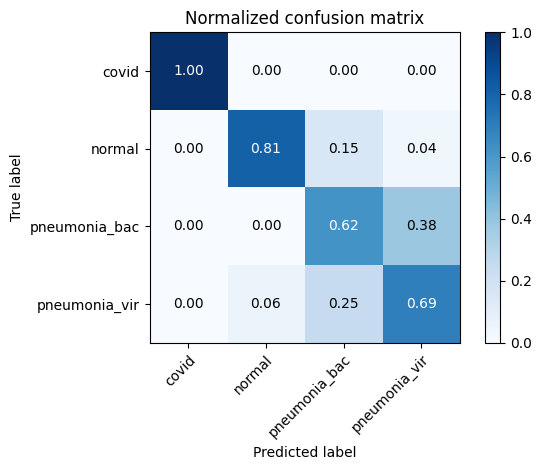

Epoch: [10]  => Evaluation Confusion Matrix Test: [1]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [11]  => Loss: [0.821]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [12]  => Loss: [0.827]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [13]  => Loss: [0.809]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [14]  => Loss: [0.830]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [15]  => Loss: [0.800]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [16]  => Loss: [0.807]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [17]  => Loss: [0.815]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [18]  => Loss: [0.787]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [19]  => Loss: [0.811]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [20]  => Loss: [0.807]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [20]  => Confusion Matrix Test: [2]  => Total Accuracy over 1800 samples: [0.799]


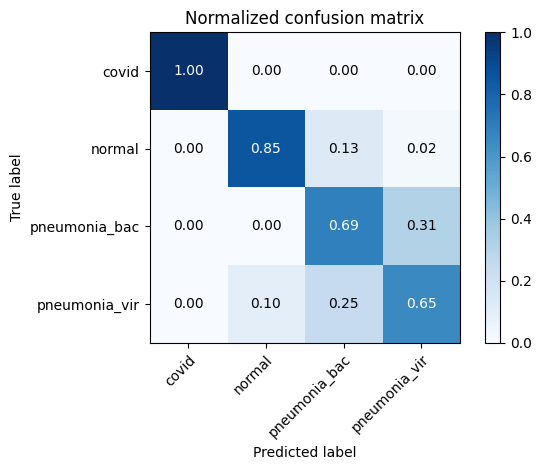

Epoch: [20]  => Evaluation Confusion Matrix Test: [2]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [21]  => Loss: [0.826]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [22]  => Loss: [0.813]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [23]  => Loss: [0.805]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [24]  => Loss: [0.804]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [25]  => Loss: [0.812]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [26]  => Loss: [0.801]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [27]  => Loss: [0.802]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [28]  => Loss: [0.808]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [29]  => Loss: [0.815]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [30]  => Loss: [0.788]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [30]  => Confusion Matrix Test: [3]  => Total Accuracy over 1800 samples: [0.782]


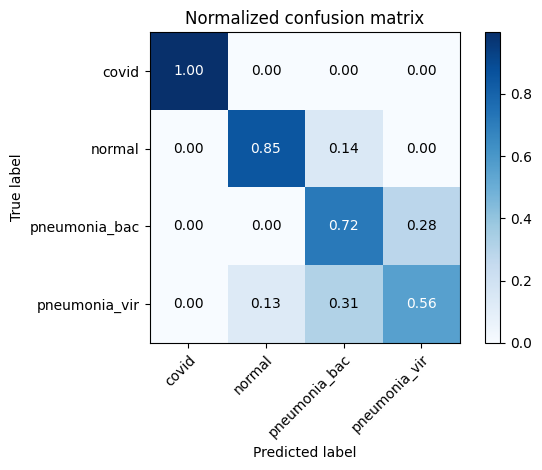

Epoch: [30]  => Evaluation Confusion Matrix Test: [3]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [31]  => Loss: [0.799]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [32]  => Loss: [0.791]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [33]  => Loss: [0.797]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [34]  => Loss: [0.809]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [35]  => Loss: [0.802]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [36]  => Loss: [0.802]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [37]  => Loss: [0.783]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [38]  => Loss: [0.796]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [39]  => Loss: [0.772]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [40]  => Loss: [0.786]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [40]  => Confusion Matrix Test: [4]  => Total Accuracy over 1800 samples: [0.806]


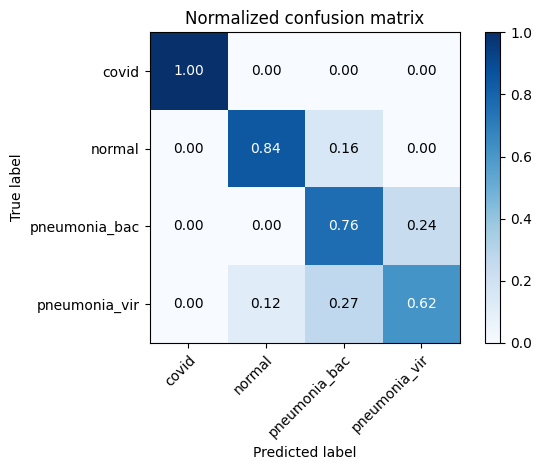

Epoch: [40]  => Evaluation Confusion Matrix Test: [4]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [41]  => Loss: [0.779]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [42]  => Loss: [0.797]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [43]  => Loss: [0.798]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [44]  => Loss: [0.810]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [45]  => Loss: [0.785]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [46]  => Loss: [0.785]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [47]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [48]  => Loss: [0.796]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [49]  => Loss: [0.785]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [50]  => Loss: [0.783]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [50]  => Confusion Matrix Test: [5]  => Total Accuracy over 1800 samples: [0.783]


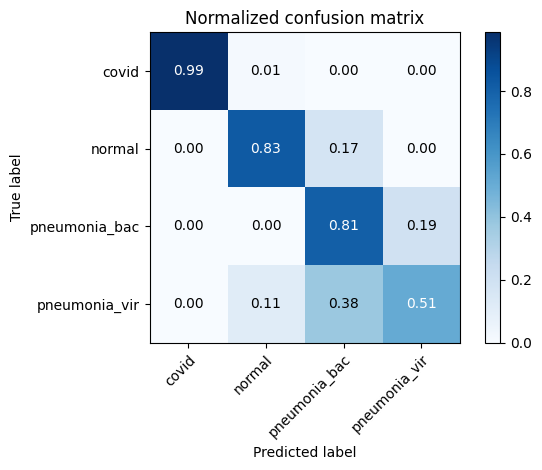

Epoch: [50]  => Evaluation Confusion Matrix Test: [5]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [51]  => Loss: [0.785]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [52]  => Loss: [0.803]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [53]  => Loss: [0.780]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [54]  => Loss: [0.789]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [55]  => Loss: [0.803]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [56]  => Loss: [0.780]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [57]  => Loss: [0.777]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [58]  => Loss: [0.805]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [59]  => Loss: [0.784]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [60]  => Loss: [0.789]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [60]  => Confusion Matrix Test: [6]  => Total Accuracy over 1800 samples: [0.759]


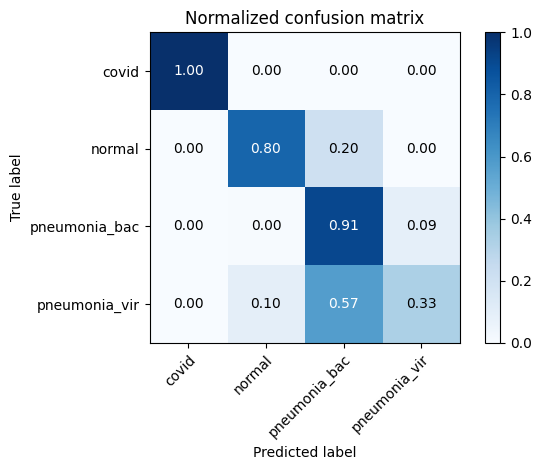

Epoch: [60]  => Evaluation Confusion Matrix Test: [6]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [61]  => Loss: [0.794]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [62]  => Loss: [0.782]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [63]  => Loss: [0.779]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [64]  => Loss: [0.789]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [65]  => Loss: [0.796]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [66]  => Loss: [0.783]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [67]  => Loss: [0.776]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [68]  => Loss: [0.792]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [69]  => Loss: [0.777]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [70]  => Loss: [0.798]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [70]  => Confusion Matrix Test: [7]  => Total Accuracy over 1800 samples: [0.782]


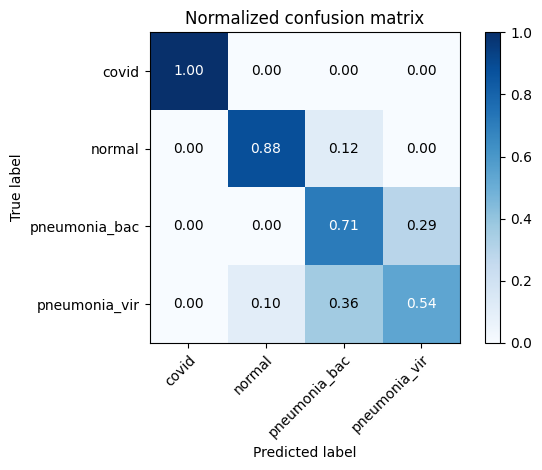

Epoch: [70]  => Evaluation Confusion Matrix Test: [7]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [71]  => Loss: [0.780]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [72]  => Loss: [0.785]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [73]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [74]  => Loss: [0.797]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [75]  => Loss: [0.788]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [76]  => Loss: [0.785]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [77]  => Loss: [0.772]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [78]  => Loss: [0.796]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [79]  => Loss: [0.804]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [80]  => Loss: [0.764]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [80]  => Confusion Matrix Test: [8]  => Total Accuracy over 1800 samples: [0.766]


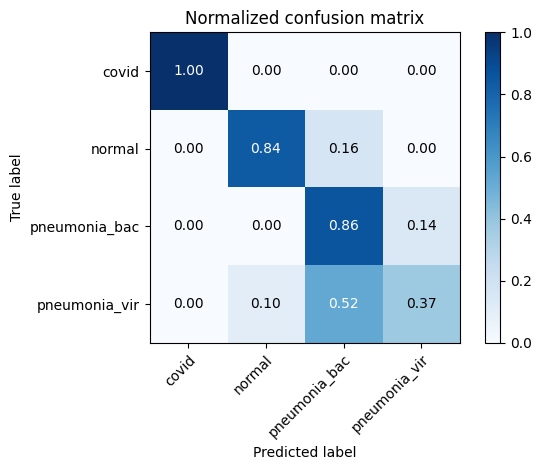

Epoch: [80]  => Evaluation Confusion Matrix Test: [8]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [81]  => Loss: [0.791]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [82]  => Loss: [0.780]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [83]  => Loss: [0.783]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [84]  => Loss: [0.780]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [85]  => Loss: [0.771]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [86]  => Loss: [0.781]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [87]  => Loss: [0.777]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [88]  => Loss: [0.789]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [89]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [90]  => Loss: [0.770]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [90]  => Confusion Matrix Test: [9]  => Total Accuracy over 1800 samples: [0.751]


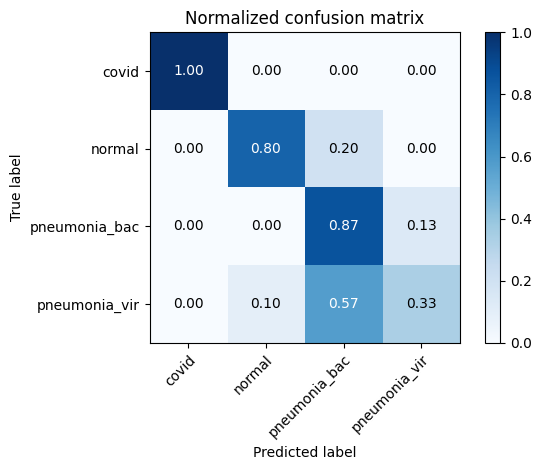

Epoch: [90]  => Evaluation Confusion Matrix Test: [9]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [91]  => Loss: [0.784]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [92]  => Loss: [0.788]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [93]  => Loss: [0.770]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [94]  => Loss: [0.774]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [95]  => Loss: [0.776]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [96]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [97]  => Loss: [0.782]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [98]  => Loss: [0.783]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [99]  => Loss: [0.783]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [100]  => Loss: [0.799]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [100]  => Confusion Matrix Test: [10]  => Total Accuracy over 1800 samples: [0.808]


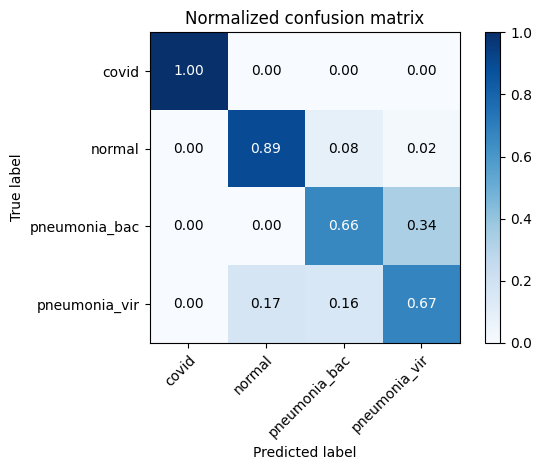

Epoch: [100]  => Evaluation Confusion Matrix Test: [10]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [101]  => Loss: [0.773]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [102]  => Loss: [0.784]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [103]  => Loss: [0.785]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [104]  => Loss: [0.779]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [105]  => Loss: [0.783]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [106]  => Loss: [0.769]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [107]  => Loss: [0.781]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [108]  => Loss: [0.776]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [109]  => Loss: [0.774]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [110]  => Loss: [0.772]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [110]  => Confusion Matrix Test: [11]  => Total Accuracy over 1800 samples: [0.800]


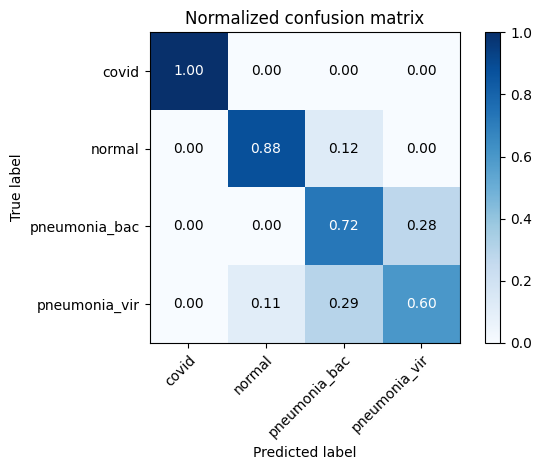

Epoch: [110]  => Evaluation Confusion Matrix Test: [11]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [111]  => Loss: [0.788]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [112]  => Loss: [0.780]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [113]  => Loss: [0.770]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [114]  => Loss: [0.762]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [115]  => Loss: [0.786]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [116]  => Loss: [0.785]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [117]  => Loss: [0.765]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [118]  => Loss: [0.782]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [119]  => Loss: [0.779]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [120]  => Loss: [0.773]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [120]  => Confusion Matrix Test: [12]  => Total Accuracy over 1800 samples: [0.808]


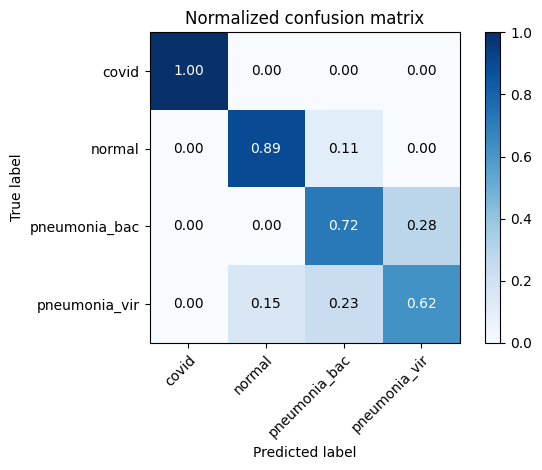

Epoch: [120]  => Evaluation Confusion Matrix Test: [12]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [121]  => Loss: [0.770]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [122]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [123]  => Loss: [0.764]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [124]  => Loss: [0.769]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [125]  => Loss: [0.762]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [126]  => Loss: [0.782]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [127]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [128]  => Loss: [0.774]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [129]  => Loss: [0.777]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [130]  => Loss: [0.774]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [130]  => Confusion Matrix Test: [13]  => Total Accuracy over 1800 samples: [0.814]


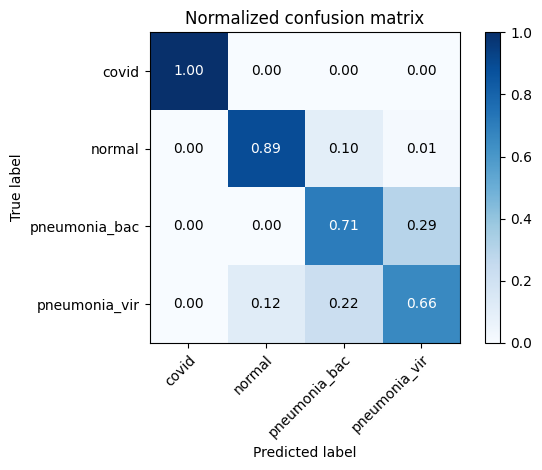

Epoch: [130]  => Evaluation Confusion Matrix Test: [13]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [131]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [132]  => Loss: [0.783]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [133]  => Loss: [0.765]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [134]  => Loss: [0.779]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [135]  => Loss: [0.766]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [136]  => Loss: [0.774]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [137]  => Loss: [0.787]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [138]  => Loss: [0.791]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [139]  => Loss: [0.784]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [140]  => Loss: [0.786]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [140]  => Confusion Matrix Test: [14]  => Total Accuracy over 1800 samples: [0.819]


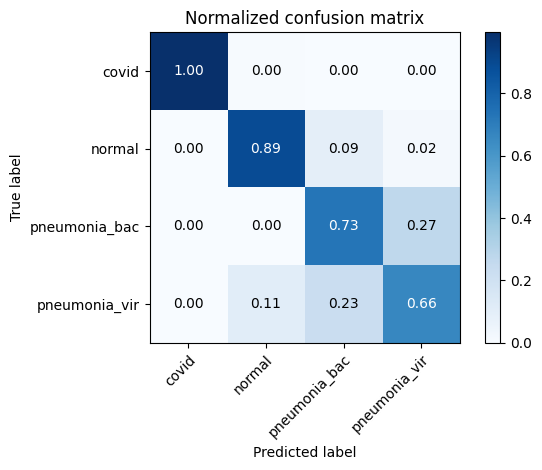

Epoch: [140]  => Evaluation Confusion Matrix Test: [14]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [141]  => Loss: [0.769]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [142]  => Loss: [0.791]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [143]  => Loss: [0.791]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [144]  => Loss: [0.788]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [145]  => Loss: [0.776]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [146]  => Loss: [0.798]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [147]  => Loss: [0.790]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [148]  => Loss: [0.797]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [149]  => Loss: [0.793]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [150]  => Loss: [0.788]


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: [150]  => Confusion Matrix Test: [15]  => Total Accuracy over 18000 samples: [0.773]


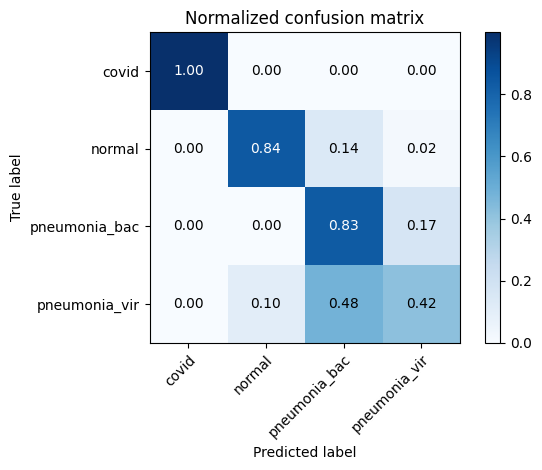

Epoch: [150]  => Evaluation Confusion Matrix Test: [15]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_150_ep_0.773_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.934 │         0.842 │         0.965 │     0.898 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.803 │         0.834 │         0.793 │     0.811 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.808 │         0.415 │         0.939 │     0.569 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [151]  => Loss: [0.772]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [152]  => Loss: [0.768]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [153]  => Loss: [0.784]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [154]  => Loss: [0.781]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [155]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [156]  => Loss: [0.766]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [157]  => Loss: [0.784]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [158]  => Loss: [0.773]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [159]  => Loss: [0.763]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [160]  => Loss: [0.762]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [160]  => Confusion Matrix Test: [16]  => Total Accuracy over 1800 samples: [0.795]


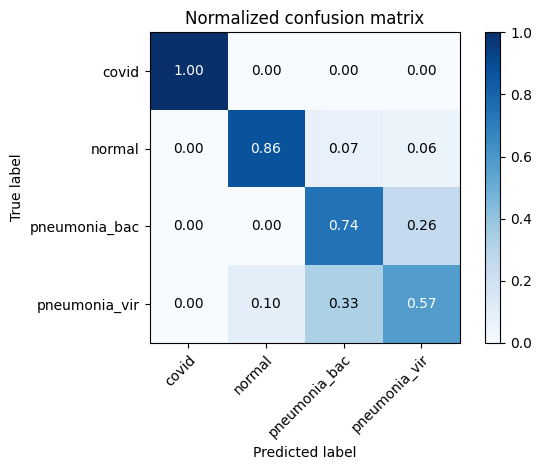

Epoch: [160]  => Evaluation Confusion Matrix Test: [16]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [161]  => Loss: [0.773]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [162]  => Loss: [0.792]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [163]  => Loss: [0.754]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [164]  => Loss: [0.770]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [165]  => Loss: [0.757]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [166]  => Loss: [0.776]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [167]  => Loss: [0.772]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [168]  => Loss: [0.762]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [169]  => Loss: [0.777]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [170]  => Loss: [0.783]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [170]  => Confusion Matrix Test: [17]  => Total Accuracy over 1800 samples: [0.735]


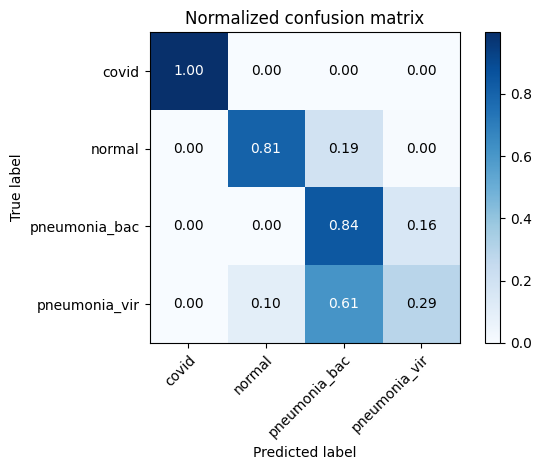

Epoch: [170]  => Evaluation Confusion Matrix Test: [17]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [171]  => Loss: [0.784]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [172]  => Loss: [0.776]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [173]  => Loss: [0.771]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [174]  => Loss: [0.769]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [175]  => Loss: [0.769]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [176]  => Loss: [0.787]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [177]  => Loss: [0.774]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [178]  => Loss: [0.781]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [179]  => Loss: [0.784]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [180]  => Loss: [0.779]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [180]  => Confusion Matrix Test: [18]  => Total Accuracy over 1800 samples: [0.806]


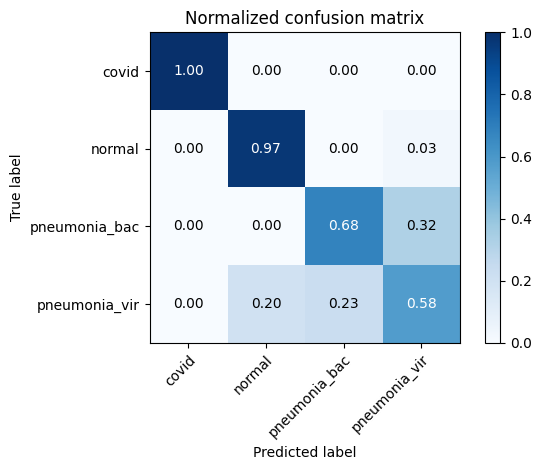

Epoch: [180]  => Evaluation Confusion Matrix Test: [18]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [181]  => Loss: [0.774]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [182]  => Loss: [0.776]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [183]  => Loss: [0.776]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [184]  => Loss: [0.777]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [185]  => Loss: [0.779]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [186]  => Loss: [0.798]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [187]  => Loss: [0.779]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [188]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [189]  => Loss: [0.769]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [190]  => Loss: [0.770]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [190]  => Confusion Matrix Test: [19]  => Total Accuracy over 1800 samples: [0.827]


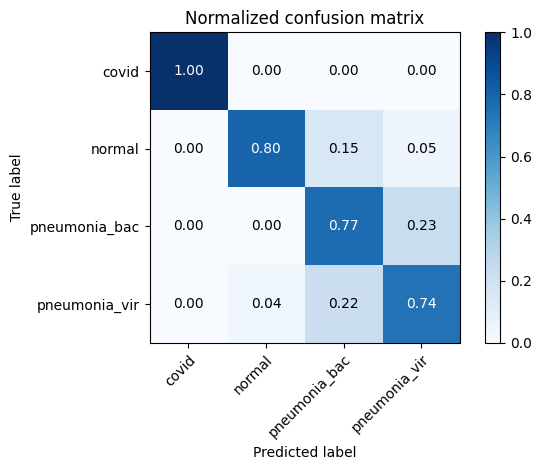

Epoch: [190]  => Evaluation Confusion Matrix Test: [19]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [191]  => Loss: [0.780]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [192]  => Loss: [0.765]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [193]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [194]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [195]  => Loss: [0.769]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [196]  => Loss: [0.784]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [197]  => Loss: [0.768]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [198]  => Loss: [0.773]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [199]  => Loss: [0.761]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [200]  => Loss: [0.778]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [200]  => Confusion Matrix Test: [20]  => Total Accuracy over 1800 samples: [0.818]


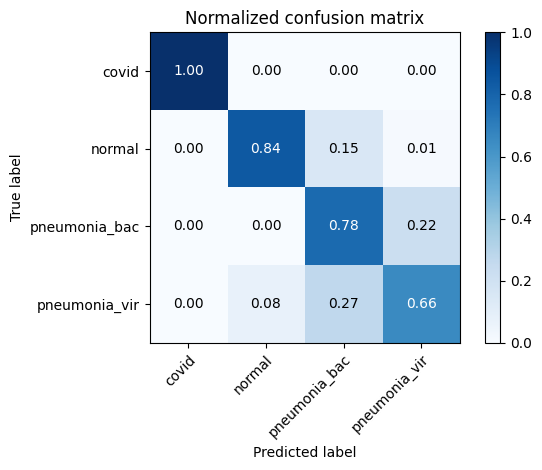

Epoch: [200]  => Evaluation Confusion Matrix Test: [20]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [201]  => Loss: [0.777]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [202]  => Loss: [0.761]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [203]  => Loss: [0.773]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [204]  => Loss: [0.766]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [205]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [206]  => Loss: [0.766]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [207]  => Loss: [0.776]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [208]  => Loss: [0.757]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [209]  => Loss: [0.770]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [210]  => Loss: [0.777]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [210]  => Confusion Matrix Test: [21]  => Total Accuracy over 1800 samples: [0.817]


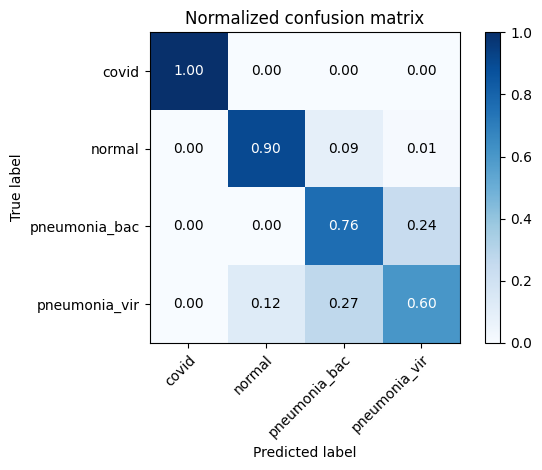

Epoch: [210]  => Evaluation Confusion Matrix Test: [21]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [211]  => Loss: [0.781]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [212]  => Loss: [0.771]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [213]  => Loss: [0.764]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [214]  => Loss: [0.756]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [215]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [216]  => Loss: [0.766]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [217]  => Loss: [0.770]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [218]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [219]  => Loss: [0.768]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [220]  => Loss: [0.764]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [220]  => Confusion Matrix Test: [22]  => Total Accuracy over 1800 samples: [0.798]


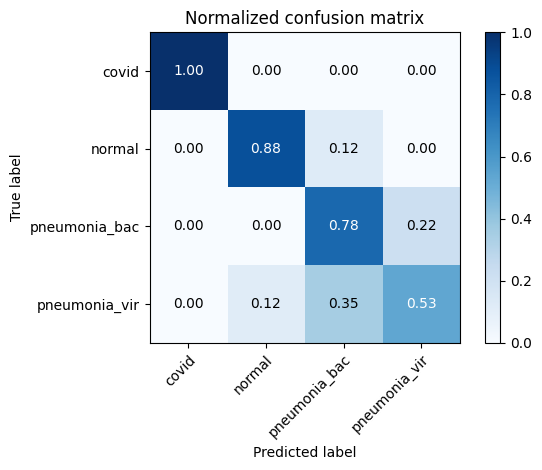

Epoch: [220]  => Evaluation Confusion Matrix Test: [22]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [221]  => Loss: [0.782]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [222]  => Loss: [0.758]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [223]  => Loss: [0.757]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [224]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [225]  => Loss: [0.778]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [226]  => Loss: [0.764]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [227]  => Loss: [0.770]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [228]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [229]  => Loss: [0.771]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [230]  => Loss: [0.770]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [230]  => Confusion Matrix Test: [23]  => Total Accuracy over 1800 samples: [0.833]


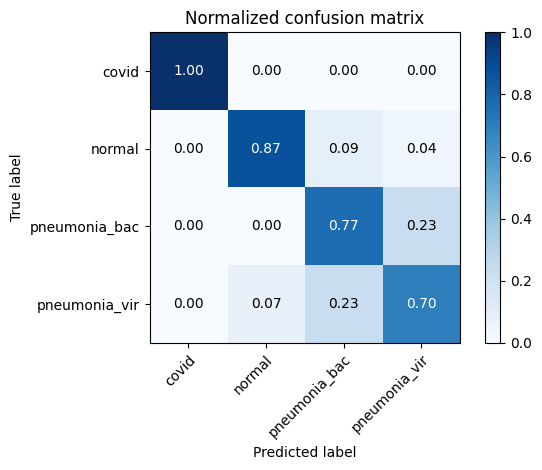

Epoch: [230]  => Evaluation Confusion Matrix Test: [23]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [231]  => Loss: [0.756]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [232]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [233]  => Loss: [0.781]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [234]  => Loss: [0.768]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [235]  => Loss: [0.779]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [236]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [237]  => Loss: [0.758]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [238]  => Loss: [0.772]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [239]  => Loss: [0.763]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [240]  => Loss: [0.768]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [240]  => Confusion Matrix Test: [24]  => Total Accuracy over 1800 samples: [0.812]


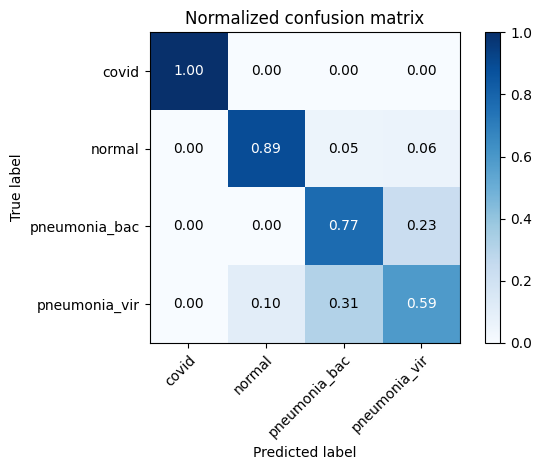

Epoch: [240]  => Evaluation Confusion Matrix Test: [24]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [241]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [242]  => Loss: [0.760]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [243]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [244]  => Loss: [0.762]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [245]  => Loss: [0.773]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [246]  => Loss: [0.772]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [247]  => Loss: [0.766]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [248]  => Loss: [0.779]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [249]  => Loss: [0.770]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [250]  => Loss: [0.760]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [250]  => Confusion Matrix Test: [25]  => Total Accuracy over 1800 samples: [0.855]


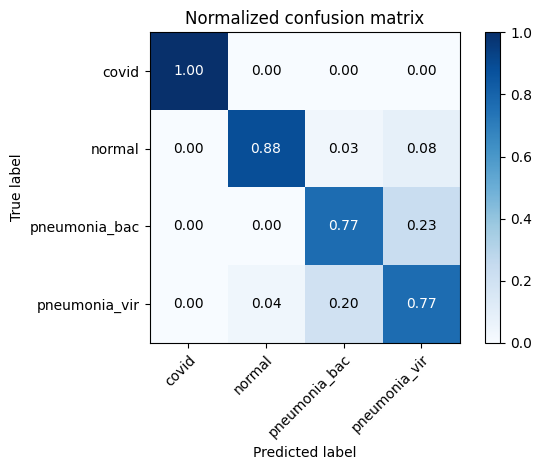

Epoch: [250]  => Evaluation Confusion Matrix Test: [25]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [251]  => Loss: [0.756]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [252]  => Loss: [0.757]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [253]  => Loss: [0.757]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [254]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [255]  => Loss: [0.764]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [256]  => Loss: [0.757]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [257]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [258]  => Loss: [0.759]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [259]  => Loss: [0.763]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [260]  => Loss: [0.759]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [260]  => Confusion Matrix Test: [26]  => Total Accuracy over 1800 samples: [0.847]


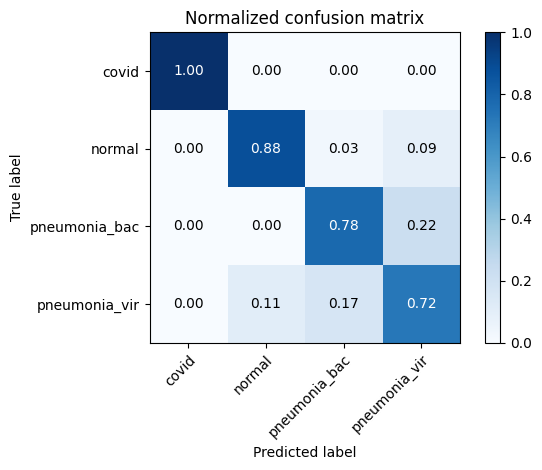

Epoch: [260]  => Evaluation Confusion Matrix Test: [26]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [261]  => Loss: [0.761]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [262]  => Loss: [0.774]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [263]  => Loss: [0.786]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [264]  => Loss: [0.768]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [265]  => Loss: [0.765]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [266]  => Loss: [0.772]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [267]  => Loss: [0.768]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [268]  => Loss: [0.763]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [269]  => Loss: [0.774]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [270]  => Loss: [0.772]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [270]  => Confusion Matrix Test: [27]  => Total Accuracy over 1800 samples: [0.842]


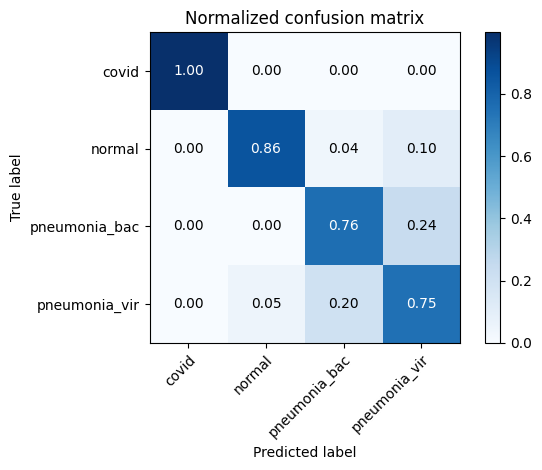

Epoch: [270]  => Evaluation Confusion Matrix Test: [27]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [271]  => Loss: [0.767]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [272]  => Loss: [0.772]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [273]  => Loss: [0.784]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [274]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [275]  => Loss: [0.788]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [276]  => Loss: [0.759]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [277]  => Loss: [0.768]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [278]  => Loss: [0.777]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [279]  => Loss: [0.781]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [280]  => Loss: [0.775]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [280]  => Confusion Matrix Test: [28]  => Total Accuracy over 1800 samples: [0.829]


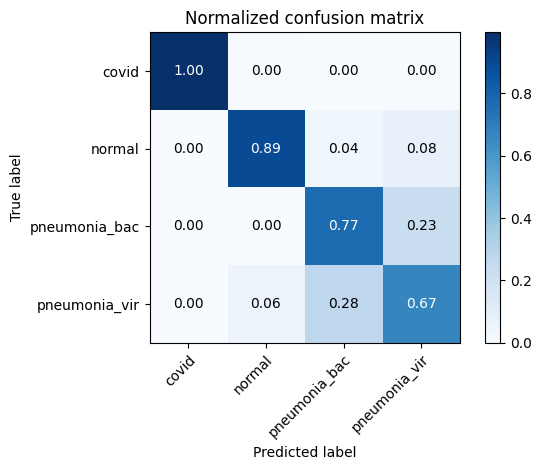

Epoch: [280]  => Evaluation Confusion Matrix Test: [28]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [281]  => Loss: [0.775]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [282]  => Loss: [0.768]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [283]  => Loss: [0.773]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [284]  => Loss: [0.754]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [285]  => Loss: [0.754]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [286]  => Loss: [0.753]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [287]  => Loss: [0.751]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [288]  => Loss: [0.769]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [289]  => Loss: [0.759]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [290]  => Loss: [0.764]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: [290]  => Confusion Matrix Test: [29]  => Total Accuracy over 1800 samples: [0.833]


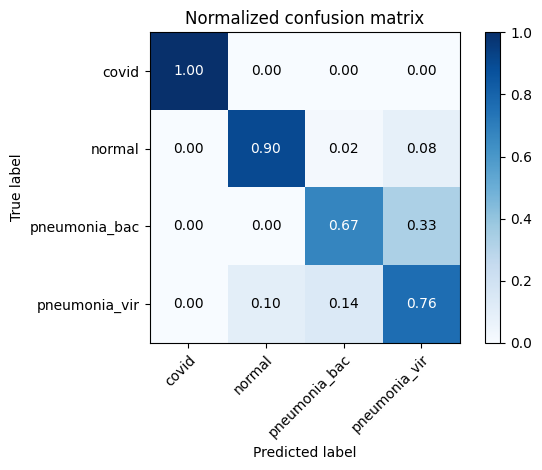

Epoch: [290]  => Evaluation Confusion Matrix Test: [29]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [291]  => Loss: [0.762]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [292]  => Loss: [0.760]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [293]  => Loss: [0.770]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [294]  => Loss: [0.756]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [295]  => Loss: [0.770]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [296]  => Loss: [0.761]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [297]  => Loss: [0.769]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [298]  => Loss: [0.770]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [299]  => Loss: [0.769]


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch: [300]  => Loss: [0.759]


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: [300]  => Confusion Matrix Test: [30]  => Total Accuracy over 18000 samples: [0.814]


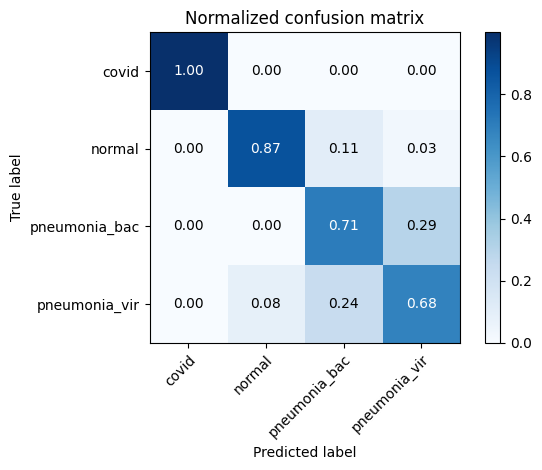

Epoch: [300]  => Evaluation Confusion Matrix Test: [30]
╒═══════════════════════════╤════════════╤═══════════════╤═══════════════╤═══════════╕
│ 4-fold_300_ep_0.814_acc   │   Accuracy │   Sensitivity │   Specificity │   F1Score │
╞═══════════════════════════╪════════════╪═══════════════╪═══════════════╪═══════════╡
│ covid                     │      1     │         1     │         1     │     1     │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ normal                    │      0.946 │         0.867 │         0.972 │     0.915 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_bac             │      0.841 │         0.706 │         0.886 │     0.784 │
├───────────────────────────┼────────────┼───────────────┼───────────────┼───────────┤
│ pneumonia_vir             │      0.84  │         0.682 │         0.893 │     0.768 │
╘═══════════════════════════╧════════════╧═══════════════╧═══════════════╧

In [ ]:
net=CNN(hidden_size, channels_size, class_number).cuda()
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=lr, momentum=m)

listtrainset = listtrainset_no_aug + listtrainset_classic + listtrainset_gan

trainset_concat = torch.utils.data.ConcatDataset(listtrainset)

sampler = torch.utils.data.RandomSampler(trainset_concat,replacement=True, num_samples=num_samples)

trainloader = torch.utils.data.DataLoader(trainset_concat,  sampler=sampler,
                                          batch_size=batch_size_train, drop_last=True)

for epoch in range(epochs):  # loop over the dataset multiple times

    running_loss = 0.0
    for data in notebook.tqdm(trainloader):
        # get the inputs; data is a list of [inputs, labels]
        
        gc.collect()
        if torch.cuda.is_available():
            inputs, labels = data[0].cuda(), data[1].cuda()  
        else:
            inputs, labels = data[0].to(device), data[1].to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
    print("Epoch: [%d]"%(epoch + 1),' => Loss: [%.3f]' %(running_loss / len(trainloader)))
    if (epoch+1)%10==0:
        with torch.no_grad():
            metrics['loss'].append([epoch+1, (running_loss / len(trainloader))])
            accuracy_tot = list(0. for i in range(len(classes)))
            sensitivity_tot = list(0. for i in range(len(classes)))
            specificity_tot = list(0. for i in range(len(classes)))
            f1score_tot = list(0. for i in range(len(classes)))
            table = list(0. for i in range(len(classes)))
            tot_acc_tot=0

            iterations=50
            if (epoch+1)%150==0:
              iterations=500
  
            labels_tot=np.array([],dtype=np.uint8)
            predicted_tot=np.array([],dtype=np.uint8)

            for i in notebook.tqdm(range(iterations)):

              dataiter = iter(testloader)
              images, labels = next(dataiter)

       

              outputs = net(images.to(device))

              _, predicted = torch.max(outputs, 1)

              labels_tot=np.append(labels_tot,labels.cpu().detach().numpy())
              predicted_tot=np.append(predicted_tot,predicted.cpu().detach().numpy())

              cm = confusion_matrix(labels.cpu().detach().numpy(), predicted.cpu().detach().numpy(), labels=None, sample_weight=None)

              tot_acc=np.trace(cm)/np.sum(cm)

              tot_acc_tot+=tot_acc

              sensitivity = list(0. for i in range(cm.shape[0]))
              specificity = list(0. for i in range(cm.shape[0]))
              accuracy = list(0. for i in range(cm.shape[0]))
              f1score = list(0. for i in range(cm.shape[0]))

              for i in range(cm.shape[0]):
                TP = cm[i,i]
                FN = np.sum(cm[i,:]) - TP
                FP = np.sum(cm[:,i]) - TP
                TN = (np.sum(cm) - TP - FP - FN)
                accuracy[i] = (TP + TN) / (TP + TN + FP + FN) 
                sensitivity[i] = TP / (TP + FN) 
                specificity[i] = TN / (TN + FP) 
                f1score[i]= 2 * (specificity[i] * sensitivity[i]) / (specificity[i] + sensitivity[i])
              accuracy_tot = [sum(x) for x in zip(accuracy_tot, accuracy)]
              specificity_tot = [sum(x) for x in zip(specificity_tot, specificity)]
              sensitivity_tot = [sum(x) for x in zip(sensitivity_tot, sensitivity)]
              f1score_tot = [sum(x) for x in zip(f1score_tot, f1score)]
              
            accuracy_tot = [round((x/iterations),3) for x in accuracy_tot]
            specificity_tot = [round((x/iterations),3) for x in specificity_tot]
            sensitivity_tot = [round((x/iterations),3) for x in sensitivity_tot]
            f1score_tot = [round((x/iterations),3) for x in f1score_tot]
            tot_acc_tot/=iterations
            running_loss/=(iterations*len(testloader))

            metrics['tot_acc'].append([epoch+1, tot_acc_tot])
            metrics['acc'].append([epoch+1, accuracy_tot])
            metrics['spec'].append([epoch+1, specificity_tot])
            metrics['sens'].append([epoch+1, sensitivity_tot])
            metrics['f1_score'].append([epoch+1, f1score_tot])

            table=[classes, accuracy_tot, sensitivity_tot, specificity_tot, f1score_tot]
            table=np.array(table).T.tolist()

            plot_confusion_matrix(labels_tot, predicted_tot, classes=np.asarray(classes), normalize=True)
            
            print("Epoch: [%d]"%(epoch + 1)," => Confusion Matrix Test: [%d]" %(int((epoch+1)/10))," => Total Accuracy over %d samples: [%.3f]" %(len(testloader.dataset)*iterations, tot_acc_tot))

            if (epoch+1)%150==0:
              plt.gcf().savefig( results_folder + name_new_folder +'/plots/confusion_matrix_%d_ep_%.3f_acc.png' % ((epoch + 1),tot_acc_tot))
            
            plt.show()

            print("Epoch: [%d]"%(epoch + 1)," => Evaluation Confusion Matrix Test: [%d]" %(int((epoch+1)/10)))

            tab = tabulate(table, headers=['%d-fold_%d_ep_%.3f_acc' % (len(classes),(epoch + 1),tot_acc_tot),'Accuracy','Sensitivity', 'Specificity', 'F1Score'], tablefmt='fancy_grid')

            if (epoch+1)%150==0:
              # plt.figure(figsize=(8,2.5))
              # plt.text(0.01, 0.05, tab, {'fontsize': 10}, fontproperties = 'monospace') 
              # plt.axis('off')
              # plt.tight_layout()
              # plt.savefig( results_folder + name_new_folder +'/plots/k_fold_%d_ep_%.3f_acc.png' % ((epoch + 1),tot_acc_tot))
              # plt.show()
            # else:
               print(tab)

            if (epoch+1)%150==0:
              PATH = results_folder + name_new_folder +'/models/'
              NAME = 'CNN_XRAY-COVID19_'+str(epoch+1)+'EP_'+str(round(tot_acc_tot,3))+'ACC_O'+str(len(listtrainset_no_aug))+'+C'+str(len(listtrainset_classic))+'+G'+str(len(listtrainset_gan))
              EXT = '.pth'
              states = {
                      'state_dict': net.state_dict(),
                      'optimizer': optimizer.state_dict(),
                      'device': device,
                      'classes': classes,
                      'metrics': metrics,
                      'train_epoch': epoch+1,
                      'dataset_code': 'O'+str(len(listtrainset_no_aug))+'+C'+str(len(listtrainset_classic))+'+G'+str(len(listtrainset_gan)),
                      'dataset_length': len(trainloader.dataset),
                      'batch': num_samples,
                      'mini-batch': batch_size_train,
                      'img_dim': (img_dim,img_dim,channels_size),
                      'date': dt.datetime.now().strftime("%Y-%m-%d_%H:%M:%S"),
              }
              torch.save(states, PATH+NAME+EXT)
              # fig = plt.figure(figsize=(25,15))
              # fig.suptitle(NAME, fontsize=16)
              # fig.subplots_adjust(hspace=0.2, wspace=0.2)
              # for i in range(1, len(METRIC_FIELDS)+1):
              #     ax = fig.add_subplot(2, 3, i)
              #     if type(metrics[METRIC_FIELDS[i-1]][1][1])==list:
              #       for j in range(len(classes)):
              #         ax.plot([x[0] for x in metrics[METRIC_FIELDS[i-1]]],[x[1][j] for x in metrics[METRIC_FIELDS[i-1]]], label=classes[j])
              #       ax.legend()
              #     else:
              #       ax.plot([x[0] for x in metrics[METRIC_FIELDS[i-1]]],[x[1] for x in metrics[METRIC_FIELDS[i-1]]])
              #     ax.set(ylabel=METRIC_FIELDS[i-1],xlabel='epochs')
              # get_fig = plt.gcf()
              # get_fig.savefig( results_folder + name_new_folder +'/plots/%s.png' % (NAME))
              # plt.show()

            if (epoch)%150==0:
              clear_output()
              
    running_loss = 0.0
print('Finished Training')
